In [3]:
!ls /home/ayon/Database/CMATERdbTrain/3
path = '/home/ayon/Database/CMATERdbTrain/'

bcc000115.bmp  bcc000127.bmp  bcc000139.bmp  bcc000151.bmp  bcc000163.bmp
bcc000116.bmp  bcc000128.bmp  bcc000140.bmp  bcc000152.bmp  bcc000164.bmp
bcc000117.bmp  bcc000129.bmp  bcc000141.bmp  bcc000153.bmp  bcc000165.bmp
bcc000118.bmp  bcc000130.bmp  bcc000142.bmp  bcc000154.bmp  bcc000166.bmp
bcc000119.bmp  bcc000131.bmp  bcc000143.bmp  bcc000155.bmp  bcc000167.bmp
bcc000120.bmp  bcc000132.bmp  bcc000144.bmp  bcc000156.bmp  bcc000168.bmp
bcc000121.bmp  bcc000133.bmp  bcc000145.bmp  bcc000157.bmp  bcc000169.bmp
bcc000122.bmp  bcc000134.bmp  bcc000146.bmp  bcc000158.bmp  bcc000170.bmp
bcc000123.bmp  bcc000135.bmp  bcc000147.bmp  bcc000159.bmp  bcc000171.bmp
bcc000124.bmp  bcc000136.bmp  bcc000148.bmp  bcc000160.bmp  bcc000172.bmp
bcc000125.bmp  bcc000137.bmp  bcc000149.bmp  bcc000161.bmp  bcc000173.bmp
bcc000126.bmp  bcc000138.bmp  bcc000150.bmp  bcc000162.bmp  bcc000174.bmp


In [4]:
import cv2
import tensorflow as tf
import numpy
import sys, os
import matplotlib.pyplot as plt
from skimage.transform import rescale, resize
from sklearn.utils import shuffle
import numpy as np

In [20]:
def load_data(path):
    sub_paths = os.listdir(path)
    img_data = []
    label_data = []
    c = 0
    for sub_path in sub_paths:
        img_paths = os.listdir(path + sub_path)
        for img_path in img_paths:
            img_th = cv2.imread(path + sub_path + '/' + img_path , 0)
            ret, img = cv2.threshold(img_th, 240, 1, cv2.THRESH_BINARY)
            if img is None: continue
#             try:
            img = cv2.resize(img, (32,32), interpolation=cv2.INTER_AREA)
#             except():
#                     pass
            label = int(sub_path)
            img_data.append(img)
            label_data.append(label)
            c = c + 1
#         print (sub_path)
    print("No of subfolders %d"%len(sub_paths), "No of images %d"%c)
    img_data = np.expand_dims(np.array(img_data),-1) #converting  to a numpy array
    #label_data = tf.one_hot(label_data, 10).eval(session = sess) # one_hot representation
#     label_data = to_one_hot(label_data, 10)
    img_data, label_data = shuffle(img_data, label_data, random_state=0)
    return img_data
# , label_data

In [21]:
train_img= load_data(path)
train_img.shape

No of subfolders 99 No of images 1309


(1309, 32, 32, 1)

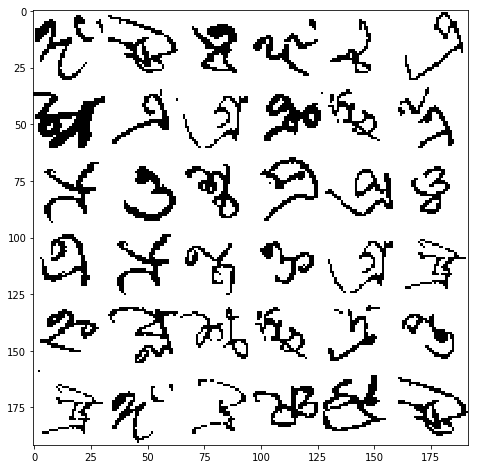

In [22]:
idx = [[2, 5, 6, 26, 77, 102], [88, 98, 100, 0, 101, 993], [33, 44, 20, 21, 24, 52], 
       [12, 33, 45, 69, 100, 200], [23, 54, 92, 101, 103, 221], [200, 1001, 65, 241, 231, 5]]
n = 6
in_canvas = np.empty((n*32, n*32))
for i,id in enumerate(idx):
    x = train_img[id][:,:,:,0]
#     print(x.shape)
    for j in range(n):
        in_canvas[i*32:(i+1)*32, j*32:(j+1)*32] = x[j,:,:]
plt.figure(figsize=(8,8))
plt.imshow(in_canvas, cmap='gray')
plt.show()

In [23]:
idx = [[2, 5, 6, 26, 77, 102], [88, 98, 100, 0, 101, 993], [33, 44, 20, 21, 24, 52], 
       [12, 33, 45, 69, 100, 200], [23, 54, 92, 101, 103, 221], [200, 1001, 65, 241, 231, 5]]
idx = np.reshape(idx, (len(idx)*len(idx[0])))
batch = train_img[idx]
idx.shape, batch.shape

((36,), (36, 32, 32, 1))

In [24]:
batch.shape

(36, 32, 32, 1)

In [25]:
conv = tf.layers.conv2d
convt = tf.layers.conv2d_transpose
maxpool = tf.layers.max_pooling2d
upsample = tf.image.resize_nearest_neighbor
Relu = tf.nn.relu

In [26]:
def Autoencoder(input):
    # tf.reset_default_graph()
    net = conv(input, filters=32, kernel_size=3, padding='SAME', strides=1, activation=Relu, name='C1_1')
    net = conv(net, filters=32, kernel_size=3, padding='SAME', strides=1, activation=Relu, name='C1_2')
    net = conv(net, filters=32, kernel_size=3, padding='SAME', strides=1, activation=Relu, name='C1_3')
    net = maxpool(net, pool_size=2, padding='SAME', strides=2, name='M1')

    net = conv(net, filters=64, kernel_size=3, padding='SAME', activation=Relu, strides=1, name='C2_1')
    net = conv(net, filters=64, kernel_size=3, padding='SAME', strides=1, activation=Relu, name='C2_2')
    net = conv(net, filters=64, kernel_size=3, padding='SAME', strides=1, activation=Relu, name='C2_3')
    net = maxpool(net, pool_size=2, padding='SAME', strides=2, name='M2')

    net = conv(net, filters=64, kernel_size=3, padding='SAME', activation=Relu, strides=1, name='C3_1')
    net = conv(net, filters=64, kernel_size=3, padding='SAME', strides=1, activation=Relu, name='C3_2')
    encoded = conv(net, filters=64, kernel_size=3, padding='SAME', strides=1, activation=Relu, name='C3_3')

    net = upsample(encoded, size=(16,16))
    net = convt(net, filters=32, kernel_size=3, padding='SAME', activation=Relu, strides=1, name='DC1_1')
    net = convt(net, filters=32, kernel_size=3, padding='SAME', strides=1, activation=Relu, name='DC1_2')
    net = convt(net, filters=32, kernel_size=3, padding='SAME', strides=1, activation=Relu, name='DC1_3')

    net = upsample(net, size=(32,32))
    decoded = convt(net, filters=1, kernel_size=3, padding='SAME', strides=1, activation=Relu, name='DC2_1')
    return encoded, decoded

In [53]:
def main(train_data, 
#          no_of_epochs = 150000,
         no_of_epochs = 1000,
         batchsize = 6):
    Input = tf.placeholder(dtype = tf.float32, shape = [None, 32, 32, 1])
    enc, dec = Autoencoder(Input)
    print(enc, dec)
    loss = tf.reduce_mean(tf.pow(dec-Input, 2))
#     correct_pred, accuracy = Accuracy_Evaluate(prediction, Label)
    optimiz = tf.train.AdamOptimizer(learning_rate = 0.0008).minimize(loss)

    init = tf.global_variables_initializer()
    sess.run(init)
 
    tf.summary.scalar('Loss_Value',loss)
#     tf.summary.scalar('Accuracy',accuracy)
    
    print('Setting up summary op...')
    summary_op = tf.summary.merge_all()
    print('Setting Up Saver...')
    summary_writer = tf.summary.FileWriter('./log_dir/', sess.graph)
    
    itr = 0
    for epoch in range(no_of_epochs):
        num = train_data.shape[0]//batchsize
        in_canv = np.empty((num*32, batchsize*32))
        out_canv = np.empty((num*32, batchsize*32))
        index = np.random.permutation(np.shape(train_data)[0])
        train_data = train_data[index, :, :, :]
        for idx in range(num): 
            
            batchx = train_data[idx*batchsize : (idx + 1)*batchsize , :, :, :]   
            for j in range(num):
                in_canv[idx*32:(idx+1)*32, j*32:(j+1)*32] = batchx[j,:,:,0]
#             print(batchx.shape)
            feed_dict = {Input : batchx}
            _, train_loss= sess.run([optimiz, loss] , feed_dict)
#             summary_writer.add_summary(summary_str, itr)
            itr = itr + 1
            
#             if idx == 5:
            print ('epoch : '+str(epoch)+' step : '+str(idx) + ' train_loss : '+str(train_loss))
        for idx in range(num):
            batchx = train_data[idx*batchsize : (idx + 1)*batchsize , :, :, :]  
            feed_dict = {Input:batchx}
            recon = sess.run(dec, feed_dict)
            for j in range(num):
                out_canv[idx*32:(idx+1)*32, j*32:(j+1)*32] = recon[j,:,:,0]
            print(batchx.shape)
        plt.figure(figsize=(10,10))
        plt.imshow(out_canv)
        plt.show()
                   

Tensor("C3_3/Relu:0", shape=(?, 8, 8, 64), dtype=float32) Tensor("DC2_1/Relu:0", shape=(?, 32, 32, 1), dtype=float32)
Setting up summary op...
Setting Up Saver...
epoch : 0 step : 0 train_loss : 0.8240908
epoch : 0 step : 1 train_loss : 0.82035416
epoch : 0 step : 2 train_loss : 0.637363
epoch : 0 step : 3 train_loss : 0.3143565
epoch : 0 step : 4 train_loss : 2.5579994
epoch : 0 step : 5 train_loss : 0.36039838
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


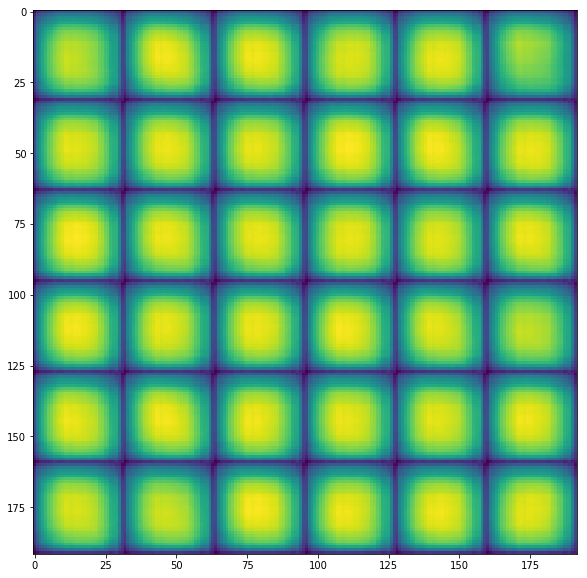

epoch : 1 step : 0 train_loss : 0.34448028
epoch : 1 step : 1 train_loss : 0.51567334
epoch : 1 step : 2 train_loss : 0.5866245
epoch : 1 step : 3 train_loss : 0.65959114
epoch : 1 step : 4 train_loss : 0.66106147
epoch : 1 step : 5 train_loss : 0.6962692
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


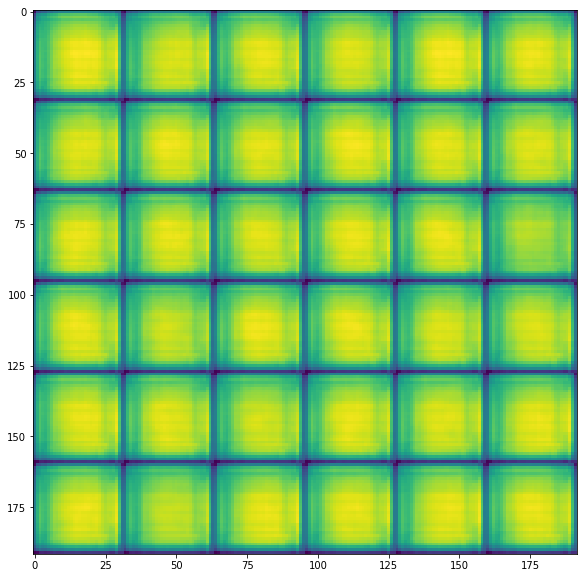

epoch : 2 step : 0 train_loss : 0.65925413
epoch : 2 step : 1 train_loss : 0.65696394
epoch : 2 step : 2 train_loss : 0.6196543
epoch : 2 step : 3 train_loss : 0.57278824
epoch : 2 step : 4 train_loss : 0.49484578
epoch : 2 step : 5 train_loss : 0.39144155
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


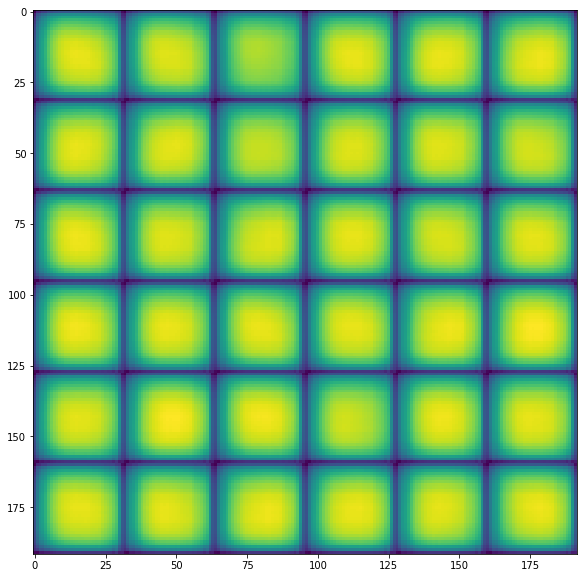

epoch : 3 step : 0 train_loss : 0.2851552
epoch : 3 step : 1 train_loss : 0.29746285
epoch : 3 step : 2 train_loss : 0.3743539
epoch : 3 step : 3 train_loss : 0.3116748
epoch : 3 step : 4 train_loss : 0.23523341
epoch : 3 step : 5 train_loss : 0.22857432
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


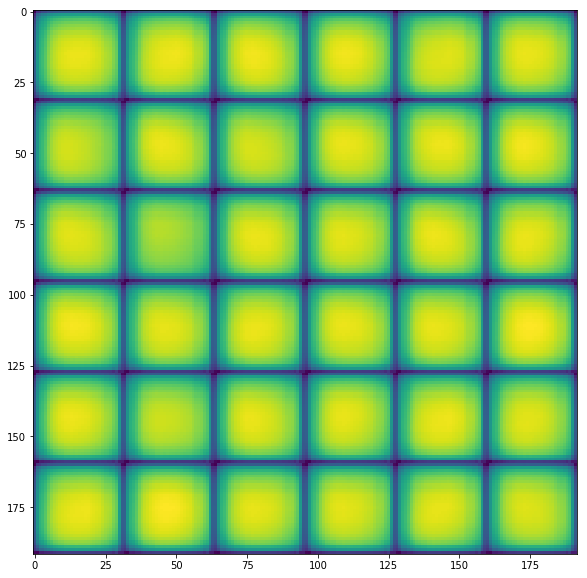

epoch : 4 step : 0 train_loss : 0.23796625
epoch : 4 step : 1 train_loss : 0.25089756
epoch : 4 step : 2 train_loss : 0.25269255
epoch : 4 step : 3 train_loss : 0.22213809
epoch : 4 step : 4 train_loss : 0.22154236
epoch : 4 step : 5 train_loss : 0.21457748
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


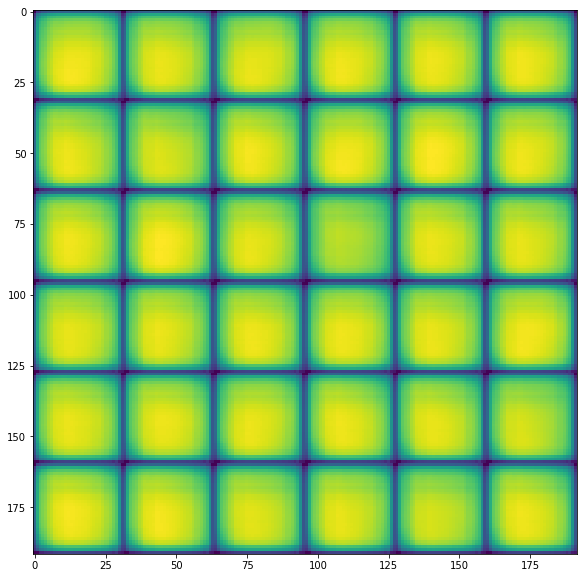

epoch : 5 step : 0 train_loss : 0.20768452
epoch : 5 step : 1 train_loss : 0.19893949
epoch : 5 step : 2 train_loss : 0.20860265
epoch : 5 step : 3 train_loss : 0.18274905
epoch : 5 step : 4 train_loss : 0.17960425
epoch : 5 step : 5 train_loss : 0.17702673
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


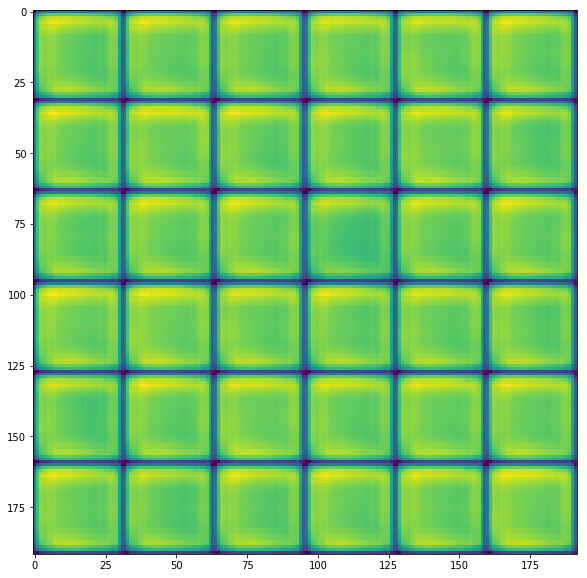

epoch : 6 step : 0 train_loss : 0.16508006
epoch : 6 step : 1 train_loss : 0.17563437
epoch : 6 step : 2 train_loss : 0.14634328
epoch : 6 step : 3 train_loss : 0.16771634
epoch : 6 step : 4 train_loss : 0.14774485
epoch : 6 step : 5 train_loss : 0.1376174
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


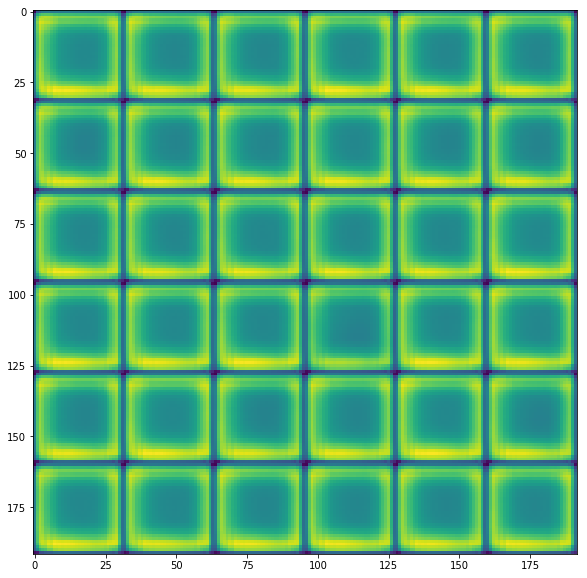

epoch : 7 step : 0 train_loss : 0.13360399
epoch : 7 step : 1 train_loss : 0.15933333
epoch : 7 step : 2 train_loss : 0.15641467
epoch : 7 step : 3 train_loss : 0.12165075
epoch : 7 step : 4 train_loss : 0.1298043
epoch : 7 step : 5 train_loss : 0.1302057
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


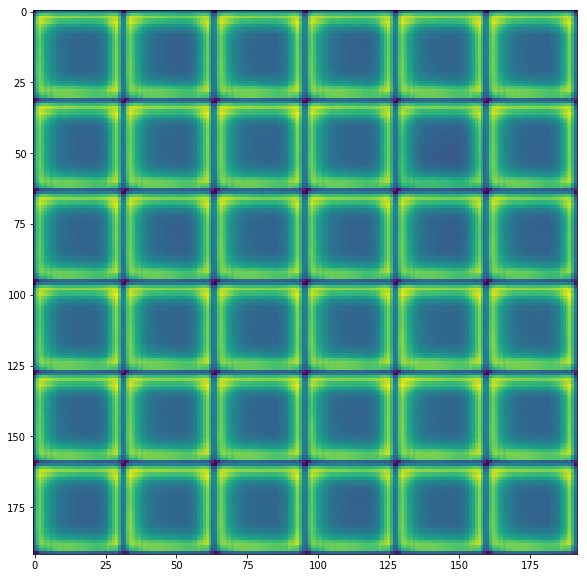

epoch : 8 step : 0 train_loss : 0.11849314
epoch : 8 step : 1 train_loss : 0.13184176
epoch : 8 step : 2 train_loss : 0.1547255
epoch : 8 step : 3 train_loss : 0.1156496
epoch : 8 step : 4 train_loss : 0.13425921
epoch : 8 step : 5 train_loss : 0.12323883
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


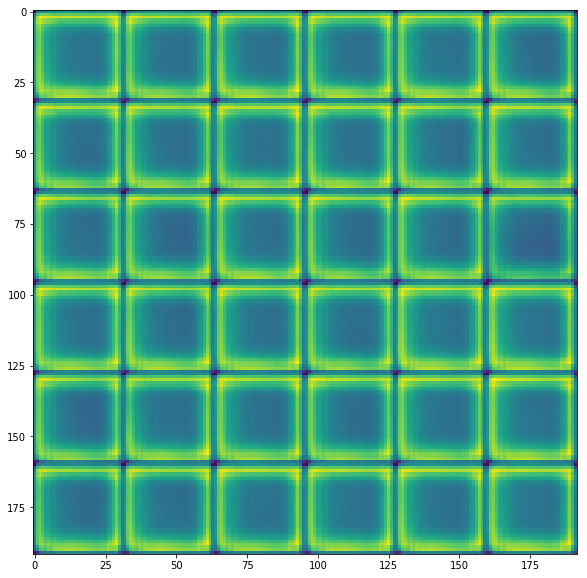

epoch : 9 step : 0 train_loss : 0.12413635
epoch : 9 step : 1 train_loss : 0.13256998
epoch : 9 step : 2 train_loss : 0.1133191
epoch : 9 step : 3 train_loss : 0.11786928
epoch : 9 step : 4 train_loss : 0.12680744
epoch : 9 step : 5 train_loss : 0.12063519
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


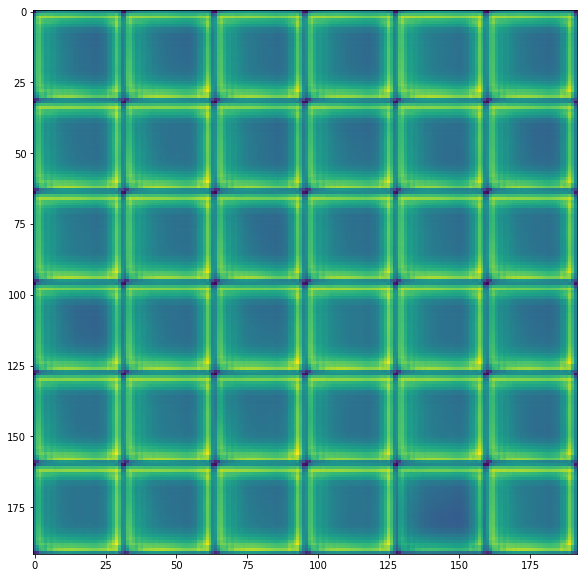

epoch : 10 step : 0 train_loss : 0.11628532
epoch : 10 step : 1 train_loss : 0.10167798
epoch : 10 step : 2 train_loss : 0.12768881
epoch : 10 step : 3 train_loss : 0.12414501
epoch : 10 step : 4 train_loss : 0.11439126
epoch : 10 step : 5 train_loss : 0.12576105
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


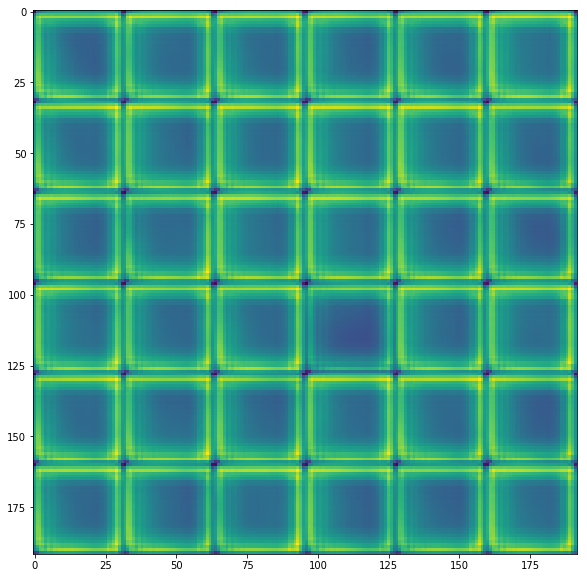

epoch : 11 step : 0 train_loss : 0.12075532
epoch : 11 step : 1 train_loss : 0.12304419
epoch : 11 step : 2 train_loss : 0.11371044
epoch : 11 step : 3 train_loss : 0.122953154
epoch : 11 step : 4 train_loss : 0.10463842
epoch : 11 step : 5 train_loss : 0.10209515
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


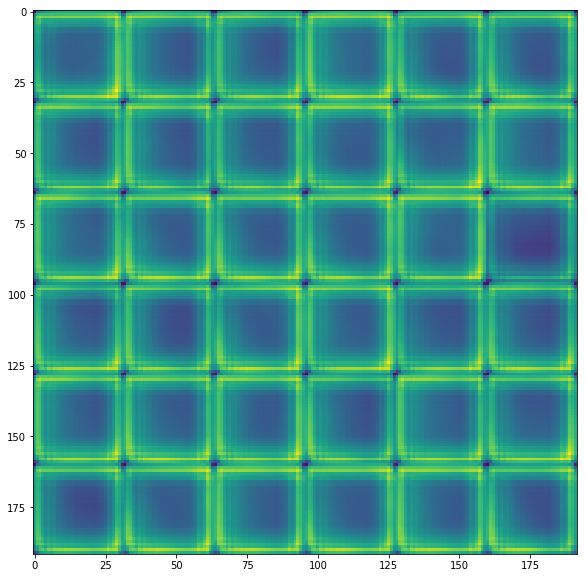

epoch : 12 step : 0 train_loss : 0.11050483
epoch : 12 step : 1 train_loss : 0.10394835
epoch : 12 step : 2 train_loss : 0.11332705
epoch : 12 step : 3 train_loss : 0.12754954
epoch : 12 step : 4 train_loss : 0.10131711
epoch : 12 step : 5 train_loss : 0.11225585
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


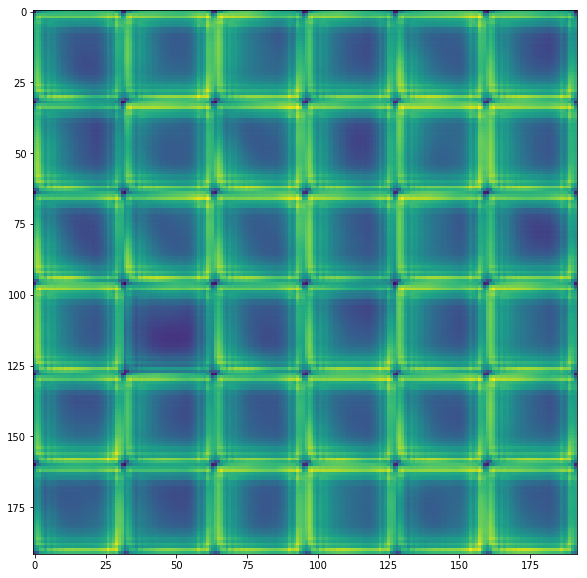

epoch : 13 step : 0 train_loss : 0.11895081
epoch : 13 step : 1 train_loss : 0.10469278
epoch : 13 step : 2 train_loss : 0.102222465
epoch : 13 step : 3 train_loss : 0.102473356
epoch : 13 step : 4 train_loss : 0.10525137
epoch : 13 step : 5 train_loss : 0.12155659
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


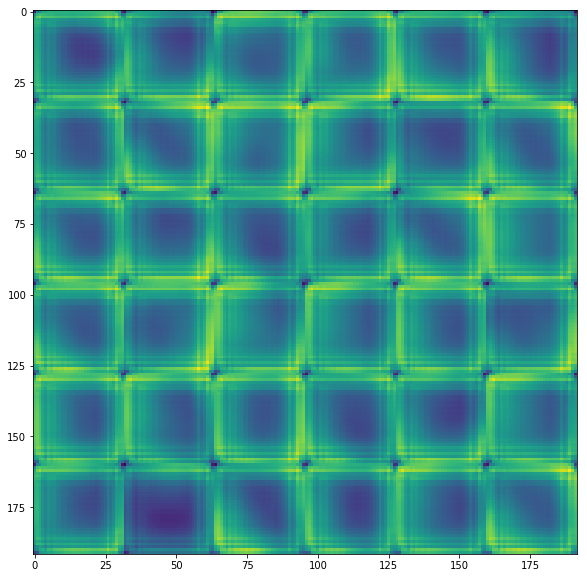

epoch : 14 step : 0 train_loss : 0.09838068
epoch : 14 step : 1 train_loss : 0.1141239
epoch : 14 step : 2 train_loss : 0.1032399
epoch : 14 step : 3 train_loss : 0.1084855
epoch : 14 step : 4 train_loss : 0.113586456
epoch : 14 step : 5 train_loss : 0.10484589
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


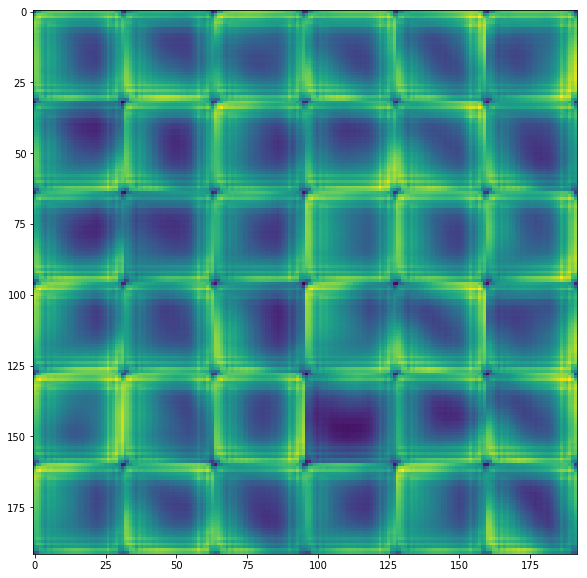

epoch : 15 step : 0 train_loss : 0.10367647
epoch : 15 step : 1 train_loss : 0.097288035
epoch : 15 step : 2 train_loss : 0.10715557
epoch : 15 step : 3 train_loss : 0.107677065
epoch : 15 step : 4 train_loss : 0.1059677
epoch : 15 step : 5 train_loss : 0.11532112
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


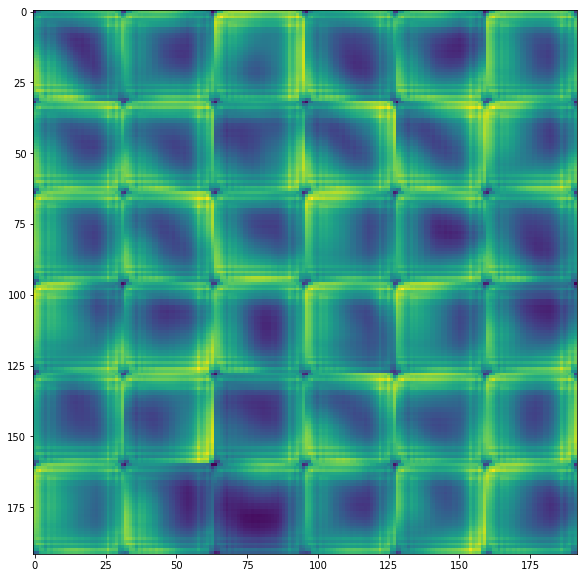

epoch : 16 step : 0 train_loss : 0.10903526
epoch : 16 step : 1 train_loss : 0.1052959
epoch : 16 step : 2 train_loss : 0.107145876
epoch : 16 step : 3 train_loss : 0.100026585
epoch : 16 step : 4 train_loss : 0.1081117
epoch : 16 step : 5 train_loss : 0.09448829
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


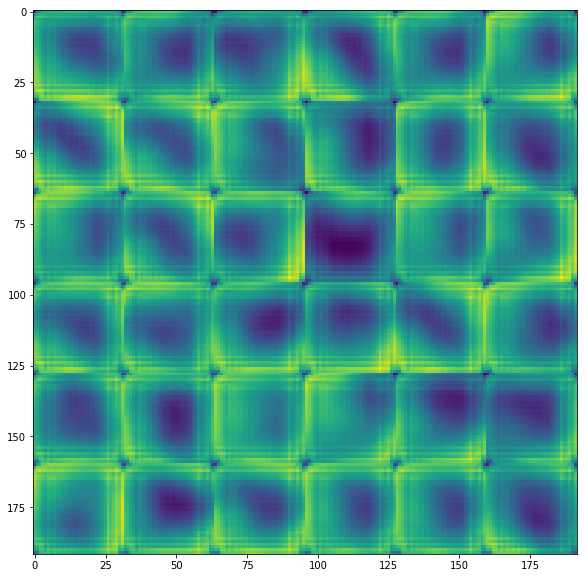

epoch : 17 step : 0 train_loss : 0.10883141
epoch : 17 step : 1 train_loss : 0.099286824
epoch : 17 step : 2 train_loss : 0.11914715
epoch : 17 step : 3 train_loss : 0.09649233
epoch : 17 step : 4 train_loss : 0.10431633
epoch : 17 step : 5 train_loss : 0.08682176
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


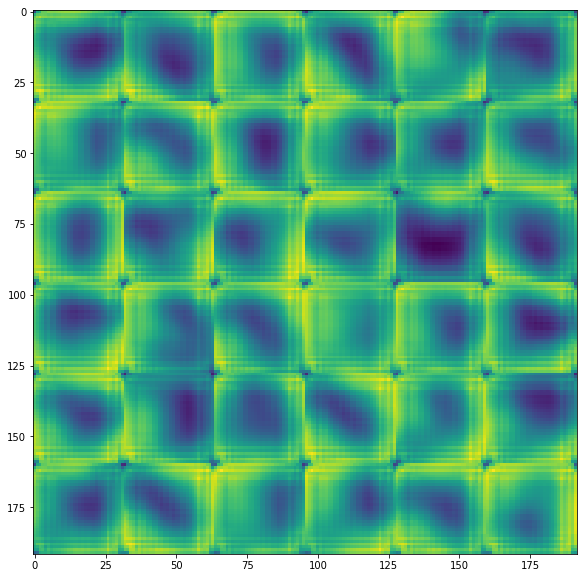

epoch : 18 step : 0 train_loss : 0.10703639
epoch : 18 step : 1 train_loss : 0.09768739
epoch : 18 step : 2 train_loss : 0.096267305
epoch : 18 step : 3 train_loss : 0.09762132
epoch : 18 step : 4 train_loss : 0.1046054
epoch : 18 step : 5 train_loss : 0.10063934
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


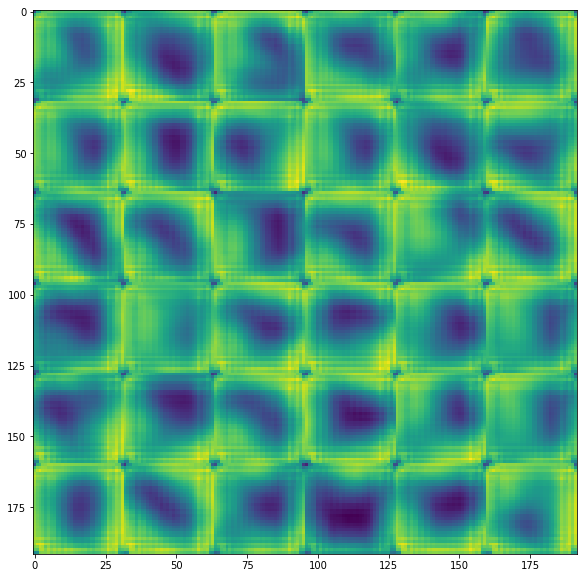

epoch : 19 step : 0 train_loss : 0.110843636
epoch : 19 step : 1 train_loss : 0.10028446
epoch : 19 step : 2 train_loss : 0.098609805
epoch : 19 step : 3 train_loss : 0.10530126
epoch : 19 step : 4 train_loss : 0.08249156
epoch : 19 step : 5 train_loss : 0.09656626
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


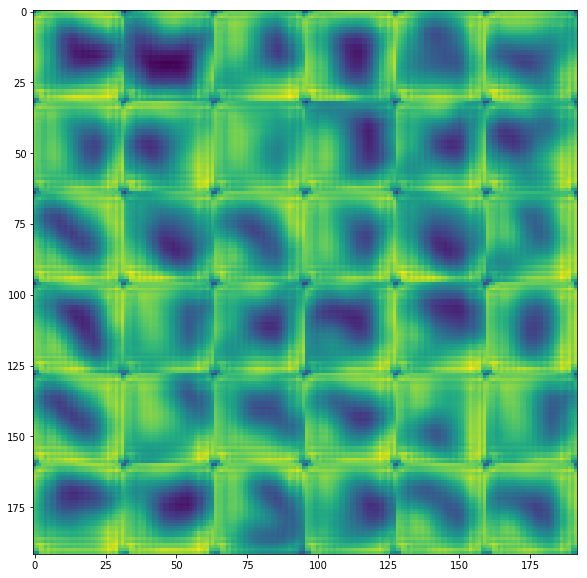

epoch : 20 step : 0 train_loss : 0.103114605
epoch : 20 step : 1 train_loss : 0.09331929
epoch : 20 step : 2 train_loss : 0.108508766
epoch : 20 step : 3 train_loss : 0.08580166
epoch : 20 step : 4 train_loss : 0.097684324
epoch : 20 step : 5 train_loss : 0.0988972
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


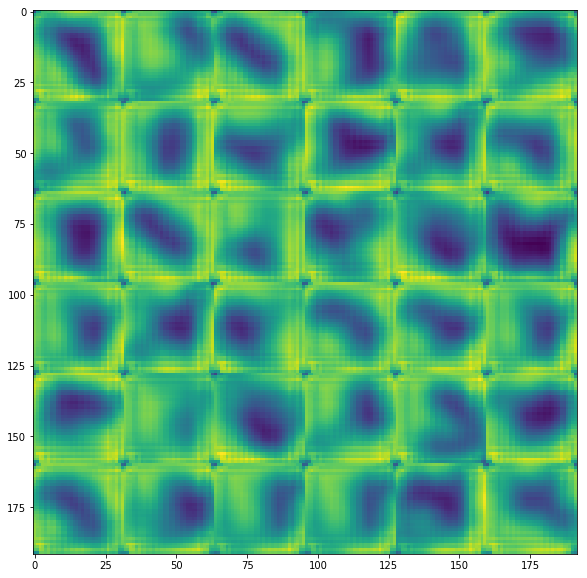

epoch : 21 step : 0 train_loss : 0.087836005
epoch : 21 step : 1 train_loss : 0.10041163
epoch : 21 step : 2 train_loss : 0.08552297
epoch : 21 step : 3 train_loss : 0.103809655
epoch : 21 step : 4 train_loss : 0.10637075
epoch : 21 step : 5 train_loss : 0.09416556
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


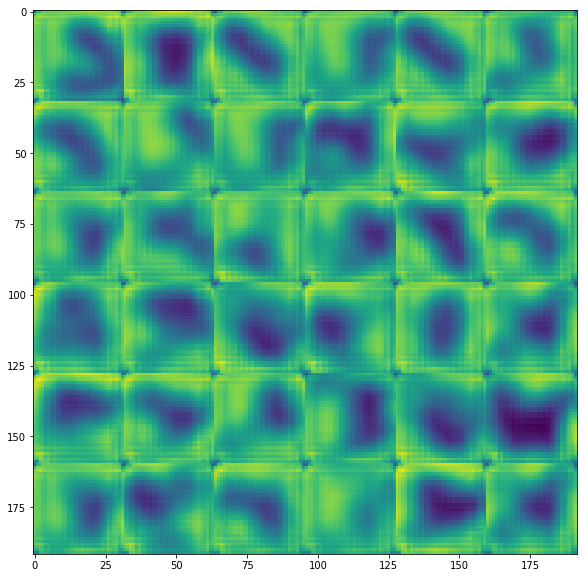

epoch : 22 step : 0 train_loss : 0.097953044
epoch : 22 step : 1 train_loss : 0.087967016
epoch : 22 step : 2 train_loss : 0.103788316
epoch : 22 step : 3 train_loss : 0.099507175
epoch : 22 step : 4 train_loss : 0.087279715
epoch : 22 step : 5 train_loss : 0.092310935
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


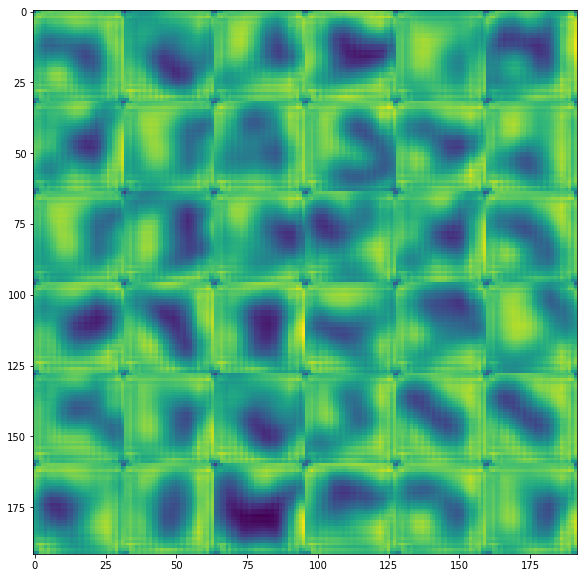

epoch : 23 step : 0 train_loss : 0.0933314
epoch : 23 step : 1 train_loss : 0.09503796
epoch : 23 step : 2 train_loss : 0.09014779
epoch : 23 step : 3 train_loss : 0.096712105
epoch : 23 step : 4 train_loss : 0.09615525
epoch : 23 step : 5 train_loss : 0.08951185
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


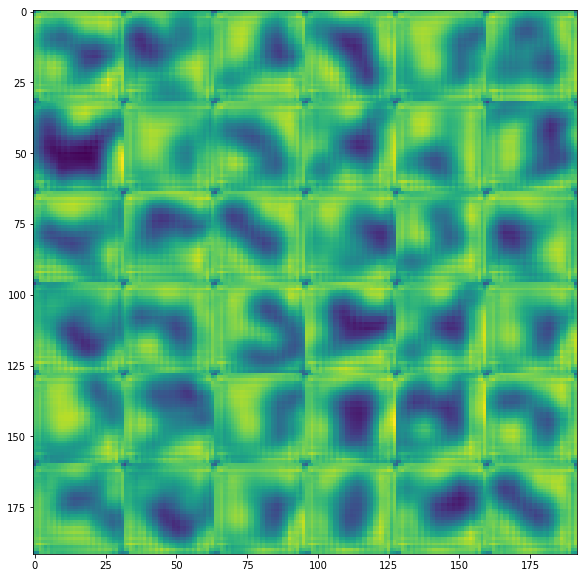

epoch : 24 step : 0 train_loss : 0.091825925
epoch : 24 step : 1 train_loss : 0.09150327
epoch : 24 step : 2 train_loss : 0.0777727
epoch : 24 step : 3 train_loss : 0.0998347
epoch : 24 step : 4 train_loss : 0.09211838
epoch : 24 step : 5 train_loss : 0.09781731
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


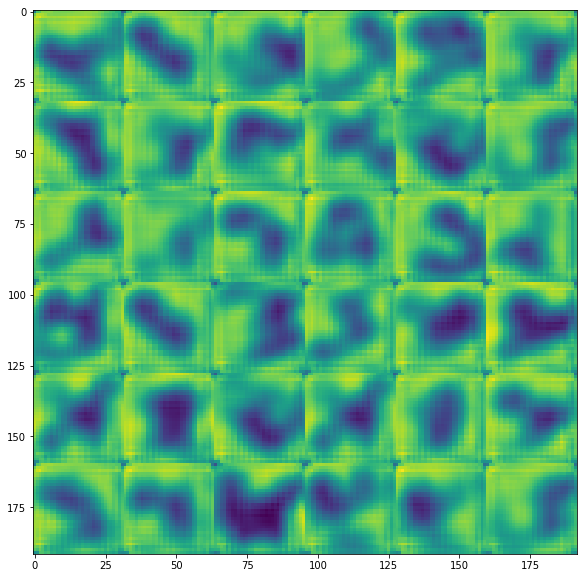

epoch : 25 step : 0 train_loss : 0.08029482
epoch : 25 step : 1 train_loss : 0.08147048
epoch : 25 step : 2 train_loss : 0.09774158
epoch : 25 step : 3 train_loss : 0.0803852
epoch : 25 step : 4 train_loss : 0.096755624
epoch : 25 step : 5 train_loss : 0.10228628
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


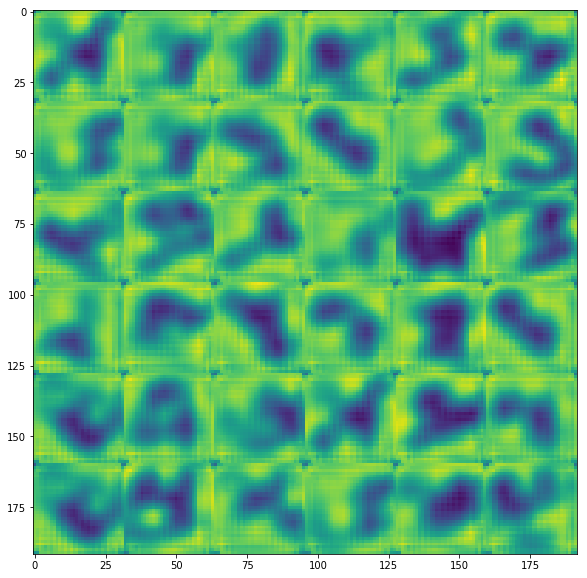

epoch : 26 step : 0 train_loss : 0.09665192
epoch : 26 step : 1 train_loss : 0.08356949
epoch : 26 step : 2 train_loss : 0.10052679
epoch : 26 step : 3 train_loss : 0.08309127
epoch : 26 step : 4 train_loss : 0.07661768
epoch : 26 step : 5 train_loss : 0.08513653
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


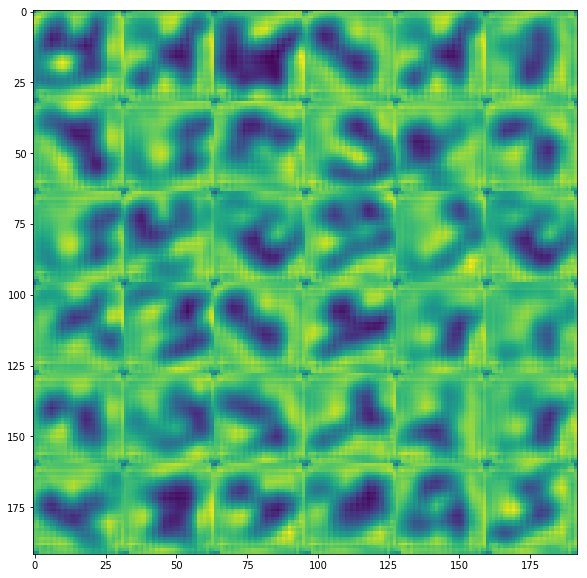

epoch : 27 step : 0 train_loss : 0.07921376
epoch : 27 step : 1 train_loss : 0.09882449
epoch : 27 step : 2 train_loss : 0.08188599
epoch : 27 step : 3 train_loss : 0.07836335
epoch : 27 step : 4 train_loss : 0.087705426
epoch : 27 step : 5 train_loss : 0.085228145
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


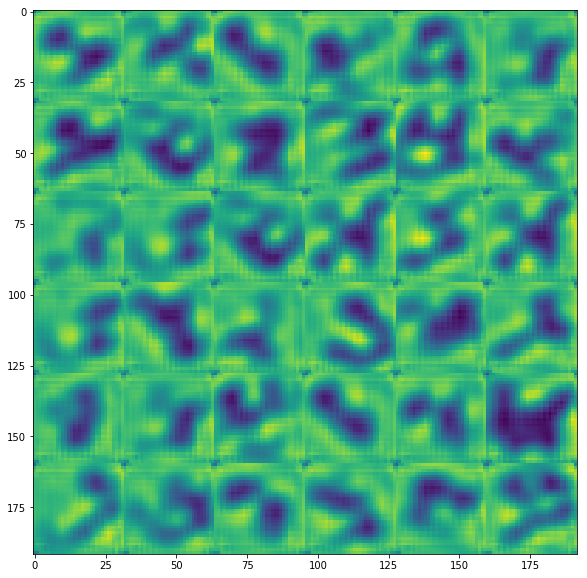

epoch : 28 step : 0 train_loss : 0.085345365
epoch : 28 step : 1 train_loss : 0.0780587
epoch : 28 step : 2 train_loss : 0.0904536
epoch : 28 step : 3 train_loss : 0.081448436
epoch : 28 step : 4 train_loss : 0.08874454
epoch : 28 step : 5 train_loss : 0.08102595
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


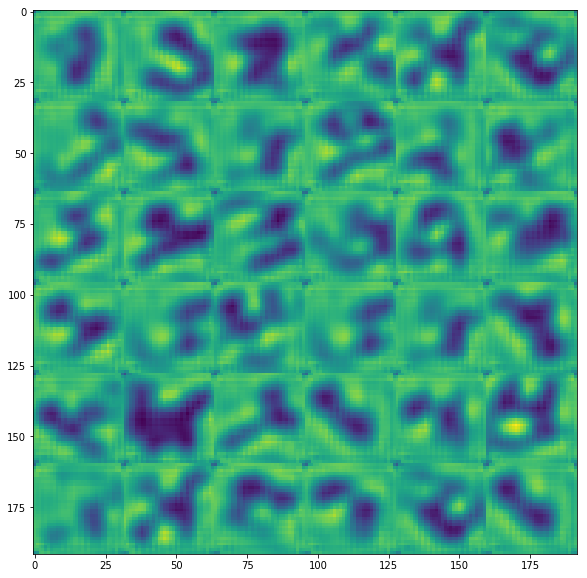

epoch : 29 step : 0 train_loss : 0.08761481
epoch : 29 step : 1 train_loss : 0.080343455
epoch : 29 step : 2 train_loss : 0.07926539
epoch : 29 step : 3 train_loss : 0.0931615
epoch : 29 step : 4 train_loss : 0.0788157
epoch : 29 step : 5 train_loss : 0.08091059
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


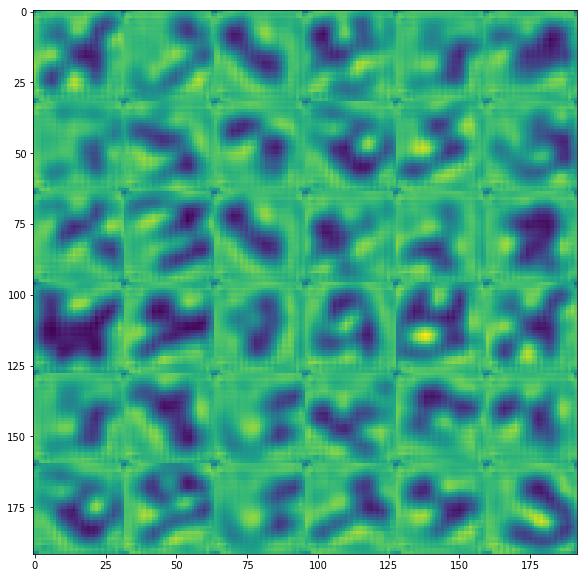

epoch : 30 step : 0 train_loss : 0.0741947
epoch : 30 step : 1 train_loss : 0.081826426
epoch : 30 step : 2 train_loss : 0.08712697
epoch : 30 step : 3 train_loss : 0.08395318
epoch : 30 step : 4 train_loss : 0.08578127
epoch : 30 step : 5 train_loss : 0.07341802
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


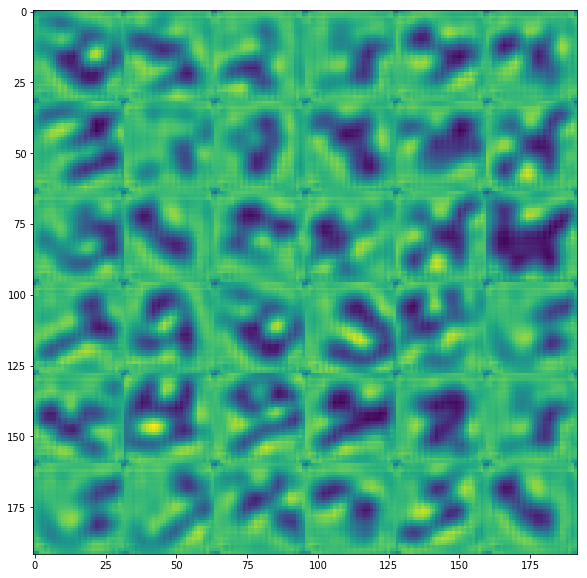

epoch : 31 step : 0 train_loss : 0.080808215
epoch : 31 step : 1 train_loss : 0.07903
epoch : 31 step : 2 train_loss : 0.082654804
epoch : 31 step : 3 train_loss : 0.071274646
epoch : 31 step : 4 train_loss : 0.0843722
epoch : 31 step : 5 train_loss : 0.07891165
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


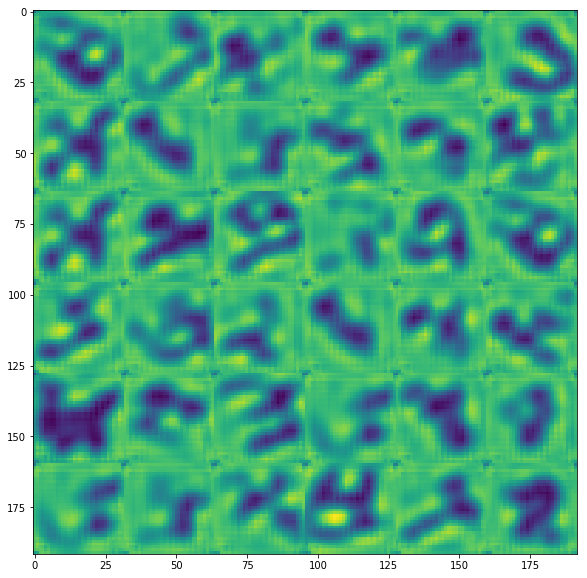

epoch : 32 step : 0 train_loss : 0.078092135
epoch : 32 step : 1 train_loss : 0.08046221
epoch : 32 step : 2 train_loss : 0.068770565
epoch : 32 step : 3 train_loss : 0.09239826
epoch : 32 step : 4 train_loss : 0.07484125
epoch : 32 step : 5 train_loss : 0.075108744
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


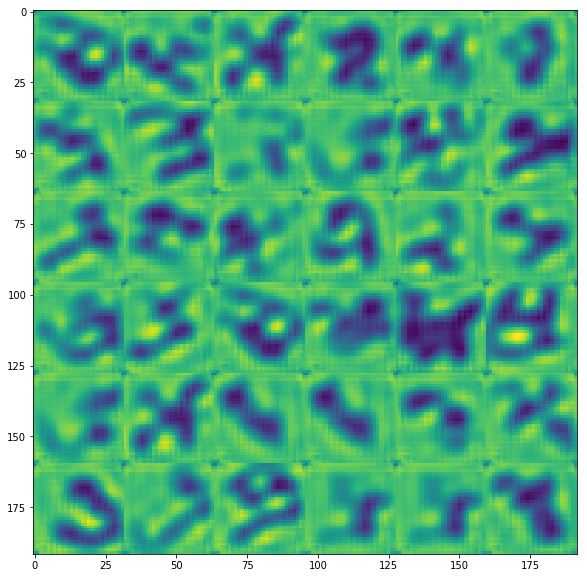

epoch : 33 step : 0 train_loss : 0.07892291
epoch : 33 step : 1 train_loss : 0.07075926
epoch : 33 step : 2 train_loss : 0.07769247
epoch : 33 step : 3 train_loss : 0.08263577
epoch : 33 step : 4 train_loss : 0.07484213
epoch : 33 step : 5 train_loss : 0.07648112
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


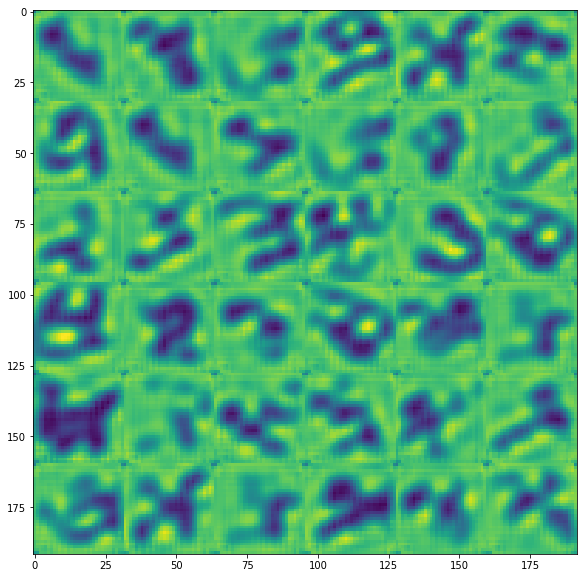

epoch : 34 step : 0 train_loss : 0.074920245
epoch : 34 step : 1 train_loss : 0.07649608
epoch : 34 step : 2 train_loss : 0.07126238
epoch : 34 step : 3 train_loss : 0.07544763
epoch : 34 step : 4 train_loss : 0.07356299
epoch : 34 step : 5 train_loss : 0.0813872
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


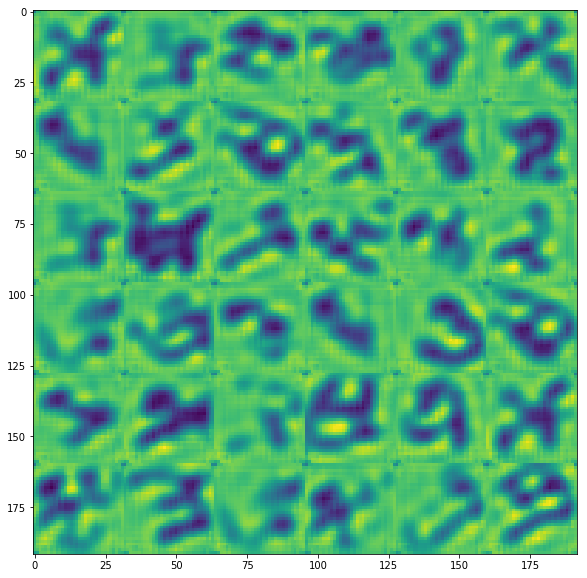

epoch : 35 step : 0 train_loss : 0.07323494
epoch : 35 step : 1 train_loss : 0.07941503
epoch : 35 step : 2 train_loss : 0.07690548
epoch : 35 step : 3 train_loss : 0.070717484
epoch : 35 step : 4 train_loss : 0.07113727
epoch : 35 step : 5 train_loss : 0.07530045
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


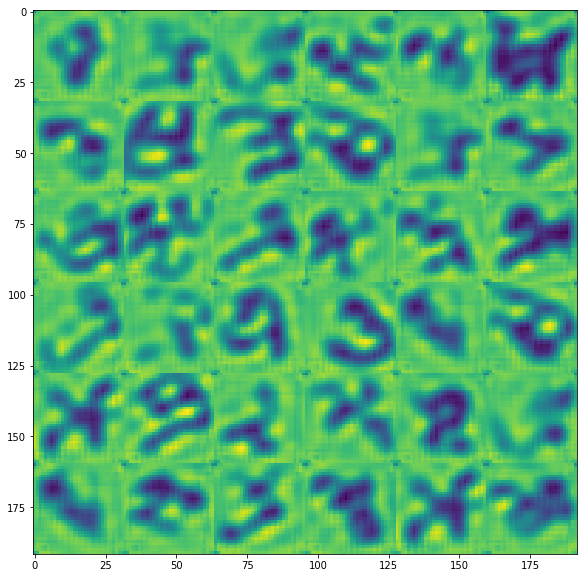

epoch : 36 step : 0 train_loss : 0.07452776
epoch : 36 step : 1 train_loss : 0.074374475
epoch : 36 step : 2 train_loss : 0.07212002
epoch : 36 step : 3 train_loss : 0.06779939
epoch : 36 step : 4 train_loss : 0.069858454
epoch : 36 step : 5 train_loss : 0.08000904
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


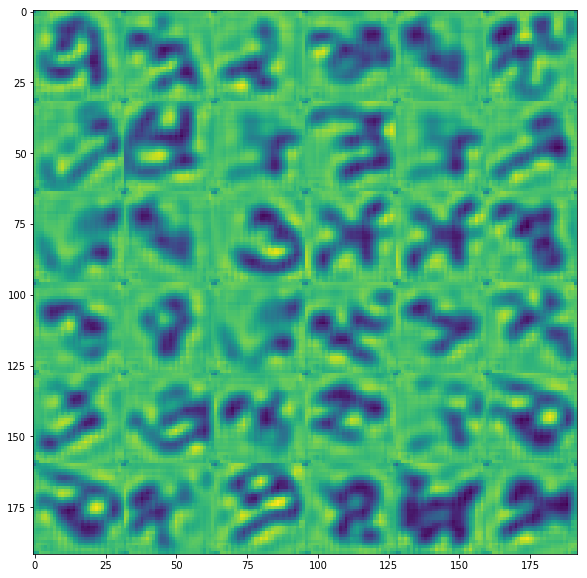

epoch : 37 step : 0 train_loss : 0.06773996
epoch : 37 step : 1 train_loss : 0.07123972
epoch : 37 step : 2 train_loss : 0.07267602
epoch : 37 step : 3 train_loss : 0.07386545
epoch : 37 step : 4 train_loss : 0.07215667
epoch : 37 step : 5 train_loss : 0.07057303
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


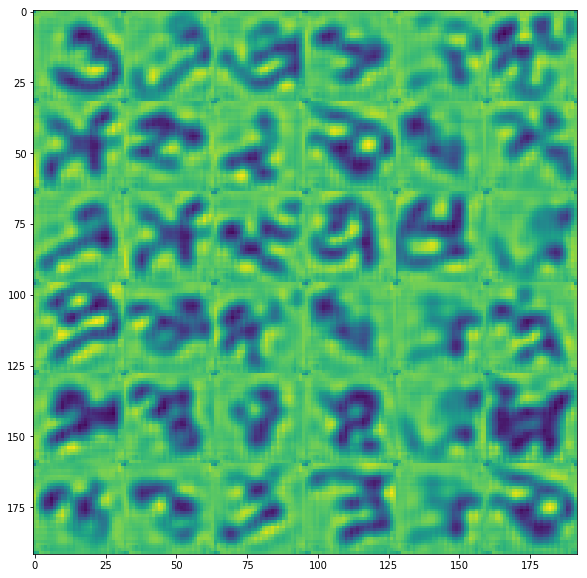

epoch : 38 step : 0 train_loss : 0.07160891
epoch : 38 step : 1 train_loss : 0.07097586
epoch : 38 step : 2 train_loss : 0.0785673
epoch : 38 step : 3 train_loss : 0.064575605
epoch : 38 step : 4 train_loss : 0.07057529
epoch : 38 step : 5 train_loss : 0.06431874
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


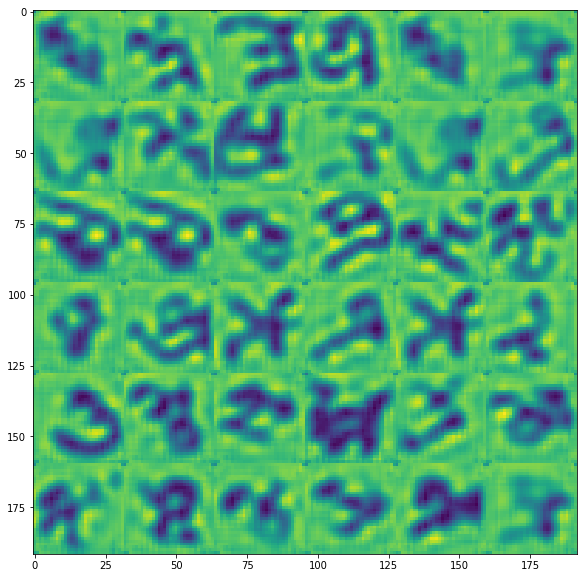

epoch : 39 step : 0 train_loss : 0.07694168
epoch : 39 step : 1 train_loss : 0.064837106
epoch : 39 step : 2 train_loss : 0.06442798
epoch : 39 step : 3 train_loss : 0.073750876
epoch : 39 step : 4 train_loss : 0.07212766
epoch : 39 step : 5 train_loss : 0.06675174
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


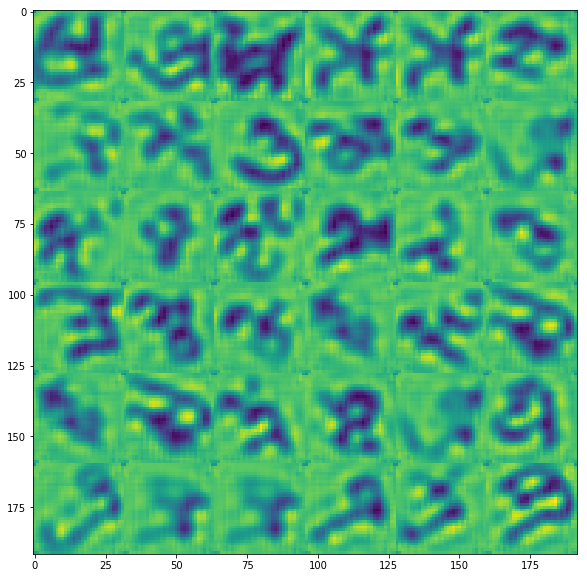

epoch : 40 step : 0 train_loss : 0.07109066
epoch : 40 step : 1 train_loss : 0.069859855
epoch : 40 step : 2 train_loss : 0.06533504
epoch : 40 step : 3 train_loss : 0.06813056
epoch : 40 step : 4 train_loss : 0.070307426
epoch : 40 step : 5 train_loss : 0.062804796
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


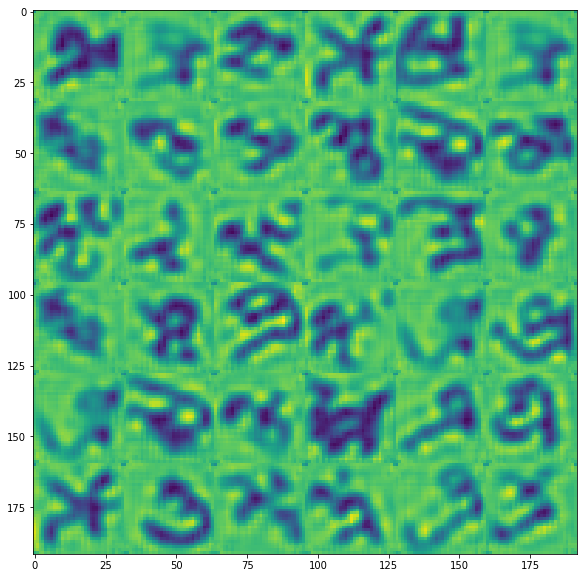

epoch : 41 step : 0 train_loss : 0.06555792
epoch : 41 step : 1 train_loss : 0.068383686
epoch : 41 step : 2 train_loss : 0.06414742
epoch : 41 step : 3 train_loss : 0.06990381
epoch : 41 step : 4 train_loss : 0.06990776
epoch : 41 step : 5 train_loss : 0.06188476
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


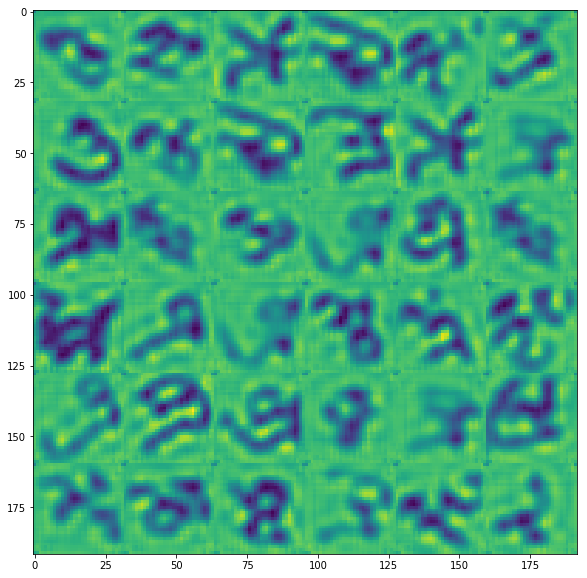

epoch : 42 step : 0 train_loss : 0.061336797
epoch : 42 step : 1 train_loss : 0.0707949
epoch : 42 step : 2 train_loss : 0.069294564
epoch : 42 step : 3 train_loss : 0.06376159
epoch : 42 step : 4 train_loss : 0.063886166
epoch : 42 step : 5 train_loss : 0.06734192
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


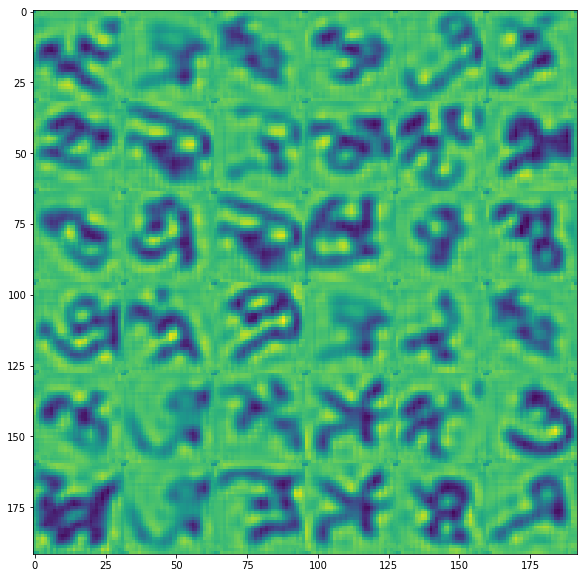

epoch : 43 step : 0 train_loss : 0.06919154
epoch : 43 step : 1 train_loss : 0.06431048
epoch : 43 step : 2 train_loss : 0.06601652
epoch : 43 step : 3 train_loss : 0.071145676
epoch : 43 step : 4 train_loss : 0.061527457
epoch : 43 step : 5 train_loss : 0.057844613
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


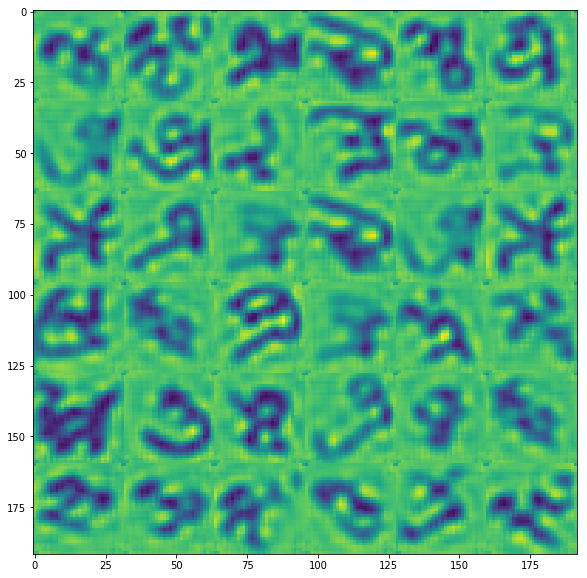

epoch : 44 step : 0 train_loss : 0.065257184
epoch : 44 step : 1 train_loss : 0.0629127
epoch : 44 step : 2 train_loss : 0.06442429
epoch : 44 step : 3 train_loss : 0.06431976
epoch : 44 step : 4 train_loss : 0.06640887
epoch : 44 step : 5 train_loss : 0.06009437
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


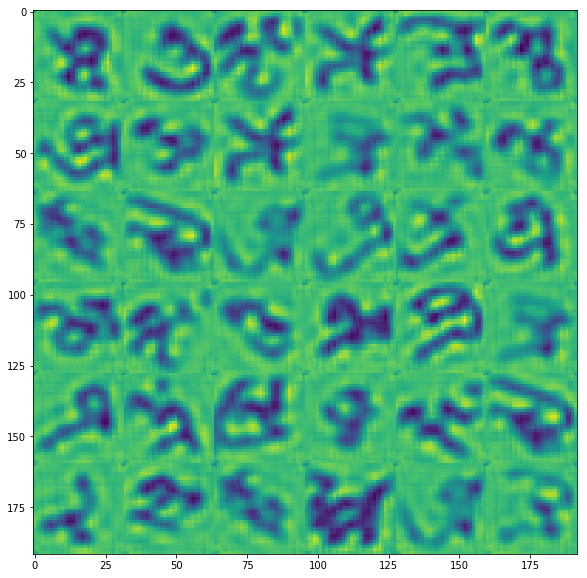

epoch : 45 step : 0 train_loss : 0.067220785
epoch : 45 step : 1 train_loss : 0.056249227
epoch : 45 step : 2 train_loss : 0.06331876
epoch : 45 step : 3 train_loss : 0.06267011
epoch : 45 step : 4 train_loss : 0.066884294
epoch : 45 step : 5 train_loss : 0.06110409
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


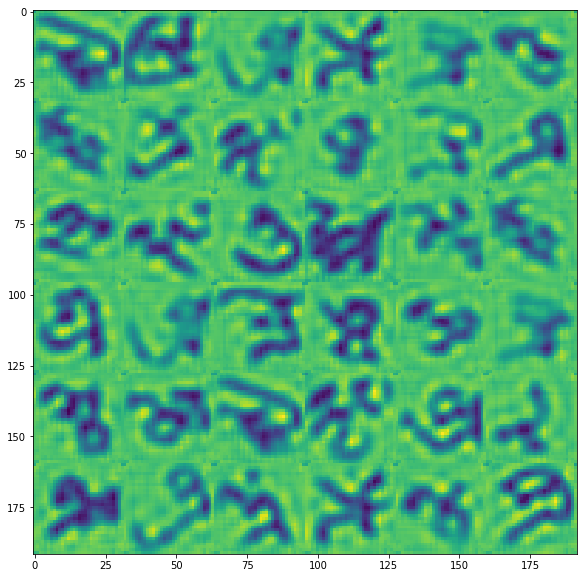

epoch : 46 step : 0 train_loss : 0.062272947
epoch : 46 step : 1 train_loss : 0.062577724
epoch : 46 step : 2 train_loss : 0.062215846
epoch : 46 step : 3 train_loss : 0.059019584
epoch : 46 step : 4 train_loss : 0.06242102
epoch : 46 step : 5 train_loss : 0.062154125
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


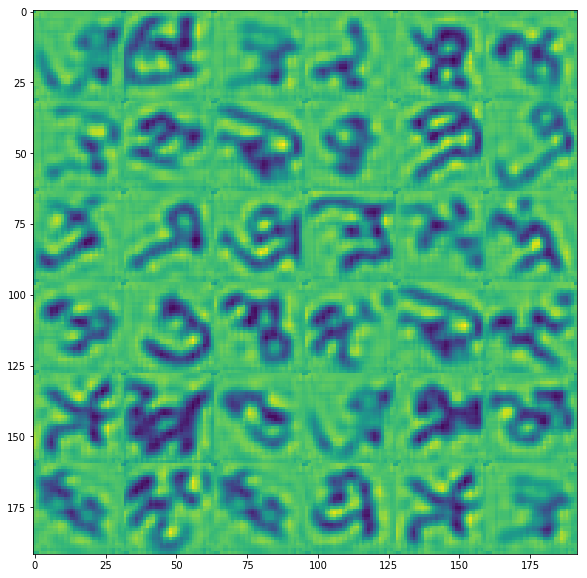

epoch : 47 step : 0 train_loss : 0.05613823
epoch : 47 step : 1 train_loss : 0.057464406
epoch : 47 step : 2 train_loss : 0.06782932
epoch : 47 step : 3 train_loss : 0.06316472
epoch : 47 step : 4 train_loss : 0.058192212
epoch : 47 step : 5 train_loss : 0.058308344
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


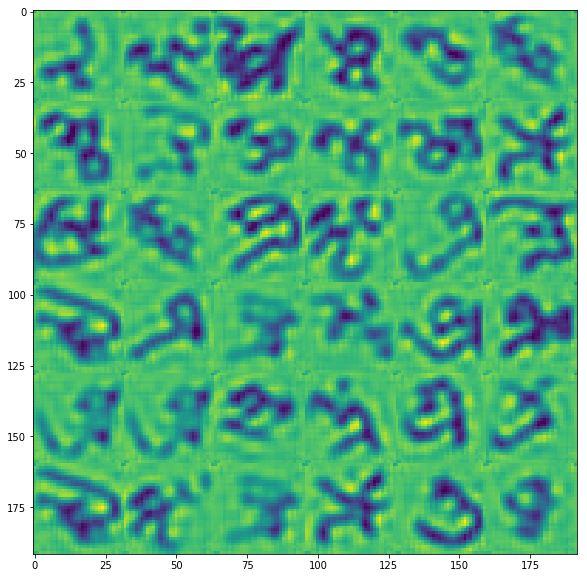

epoch : 48 step : 0 train_loss : 0.05562951
epoch : 48 step : 1 train_loss : 0.064240135
epoch : 48 step : 2 train_loss : 0.061074585
epoch : 48 step : 3 train_loss : 0.05422085
epoch : 48 step : 4 train_loss : 0.060444016
epoch : 48 step : 5 train_loss : 0.05703925
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


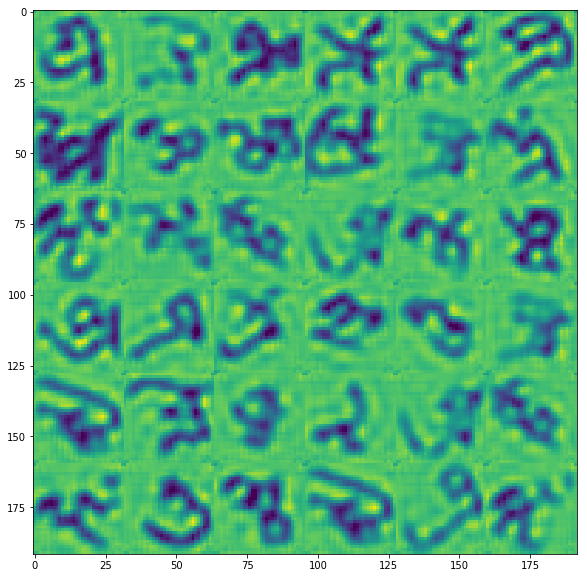

epoch : 49 step : 0 train_loss : 0.0538625
epoch : 49 step : 1 train_loss : 0.05655079
epoch : 49 step : 2 train_loss : 0.060727388
epoch : 49 step : 3 train_loss : 0.06077203
epoch : 49 step : 4 train_loss : 0.05327022
epoch : 49 step : 5 train_loss : 0.05789754
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


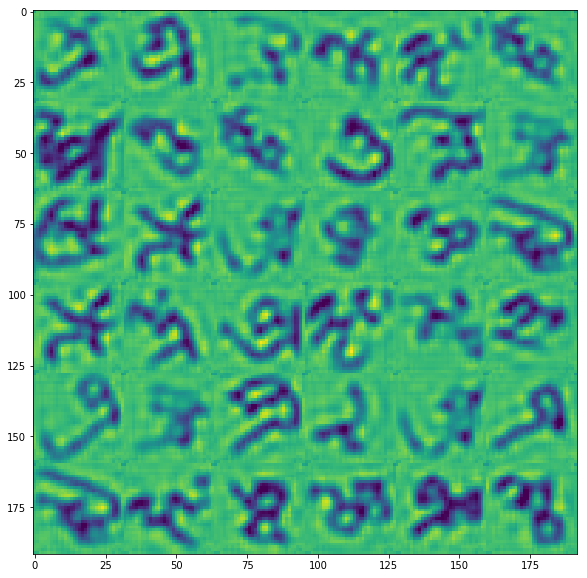

epoch : 50 step : 0 train_loss : 0.0519082
epoch : 50 step : 1 train_loss : 0.055613726
epoch : 50 step : 2 train_loss : 0.057476383
epoch : 50 step : 3 train_loss : 0.05374742
epoch : 50 step : 4 train_loss : 0.05225112
epoch : 50 step : 5 train_loss : 0.061861437
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


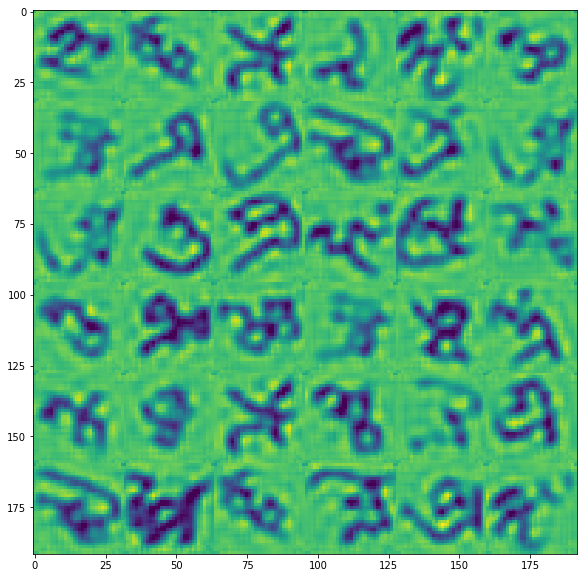

epoch : 51 step : 0 train_loss : 0.063976675
epoch : 51 step : 1 train_loss : 0.05027272
epoch : 51 step : 2 train_loss : 0.048503537
epoch : 51 step : 3 train_loss : 0.05275635
epoch : 51 step : 4 train_loss : 0.05543382
epoch : 51 step : 5 train_loss : 0.056386814
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


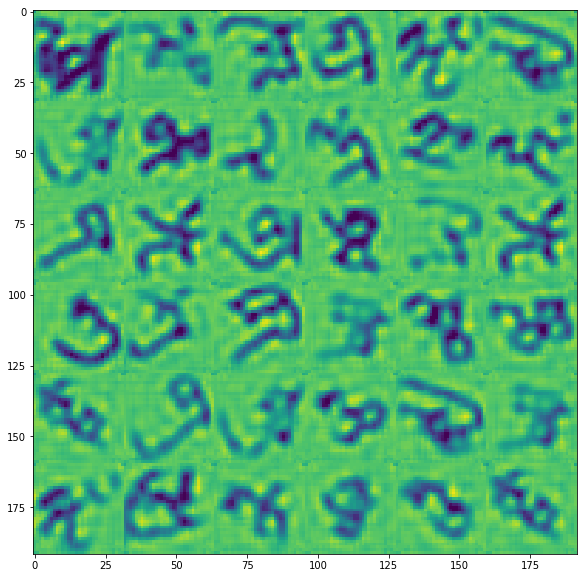

epoch : 52 step : 0 train_loss : 0.06233645
epoch : 52 step : 1 train_loss : 0.053209946
epoch : 52 step : 2 train_loss : 0.054862693
epoch : 52 step : 3 train_loss : 0.051230837
epoch : 52 step : 4 train_loss : 0.05617413
epoch : 52 step : 5 train_loss : 0.051760703
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


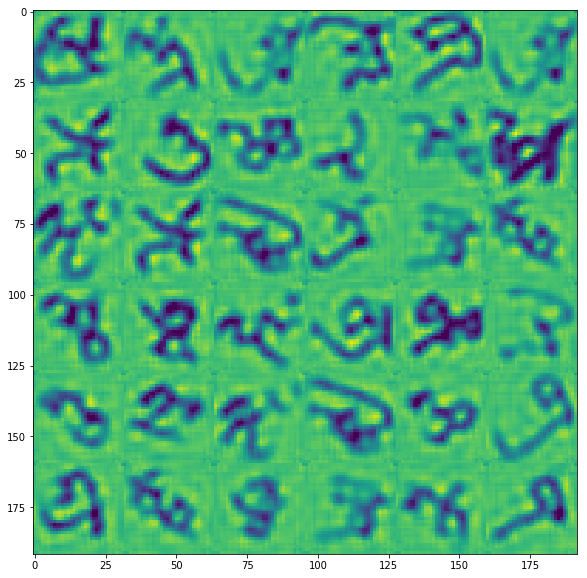

epoch : 53 step : 0 train_loss : 0.053765208
epoch : 53 step : 1 train_loss : 0.052820373
epoch : 53 step : 2 train_loss : 0.05421197
epoch : 53 step : 3 train_loss : 0.054656774
epoch : 53 step : 4 train_loss : 0.05307828
epoch : 53 step : 5 train_loss : 0.054546874
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


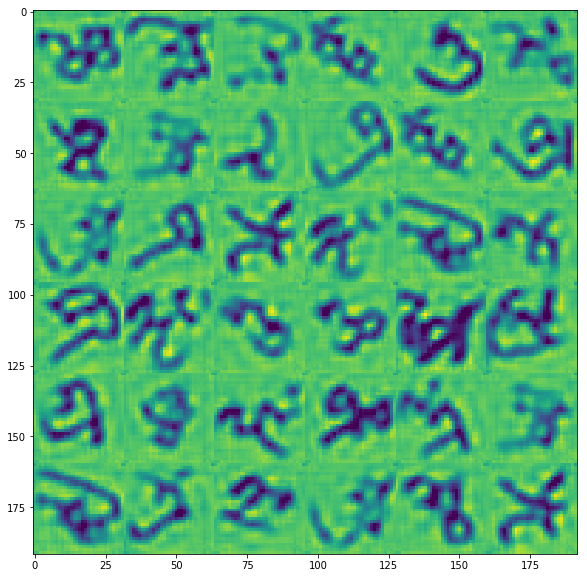

epoch : 54 step : 0 train_loss : 0.04527012
epoch : 54 step : 1 train_loss : 0.05239673
epoch : 54 step : 2 train_loss : 0.05235822
epoch : 54 step : 3 train_loss : 0.05377986
epoch : 54 step : 4 train_loss : 0.04760332
epoch : 54 step : 5 train_loss : 0.05675292
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


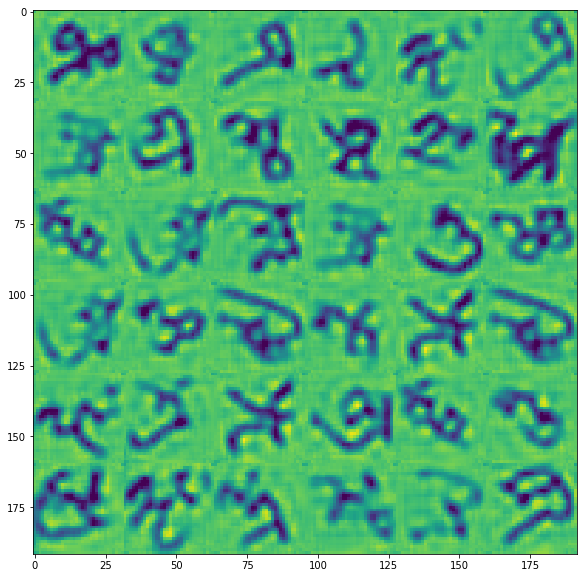

epoch : 55 step : 0 train_loss : 0.043031346
epoch : 55 step : 1 train_loss : 0.05219723
epoch : 55 step : 2 train_loss : 0.05314723
epoch : 55 step : 3 train_loss : 0.05726865
epoch : 55 step : 4 train_loss : 0.04800498
epoch : 55 step : 5 train_loss : 0.048738386
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


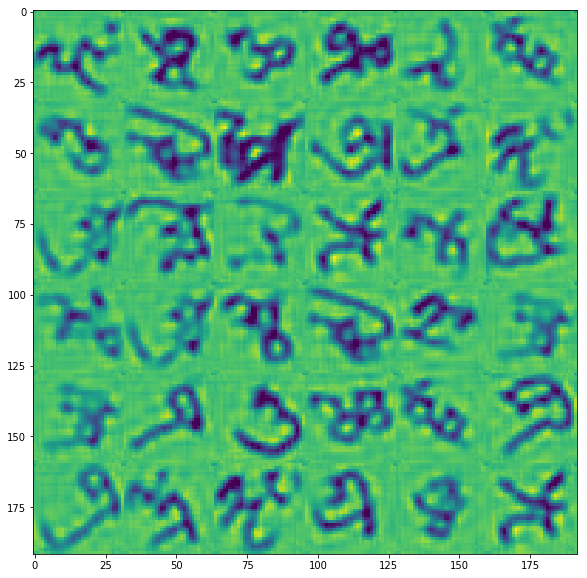

epoch : 56 step : 0 train_loss : 0.051576655
epoch : 56 step : 1 train_loss : 0.050660033
epoch : 56 step : 2 train_loss : 0.048221517
epoch : 56 step : 3 train_loss : 0.04966411
epoch : 56 step : 4 train_loss : 0.050983977
epoch : 56 step : 5 train_loss : 0.04721324
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


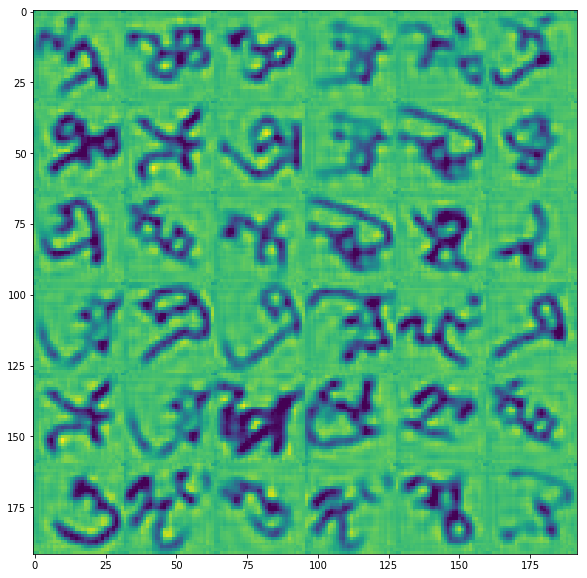

epoch : 57 step : 0 train_loss : 0.053127784
epoch : 57 step : 1 train_loss : 0.0491229
epoch : 57 step : 2 train_loss : 0.04704918
epoch : 57 step : 3 train_loss : 0.04961112
epoch : 57 step : 4 train_loss : 0.041476995
epoch : 57 step : 5 train_loss : 0.050288785
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


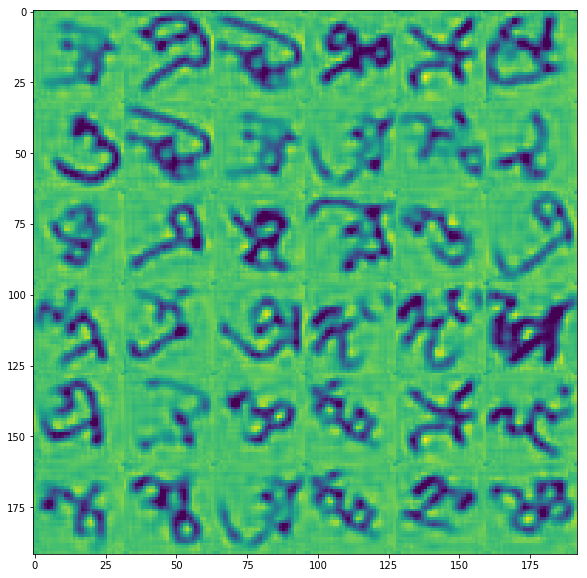

epoch : 58 step : 0 train_loss : 0.054449707
epoch : 58 step : 1 train_loss : 0.042232756
epoch : 58 step : 2 train_loss : 0.04281771
epoch : 58 step : 3 train_loss : 0.050972912
epoch : 58 step : 4 train_loss : 0.051832277
epoch : 58 step : 5 train_loss : 0.03966197
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


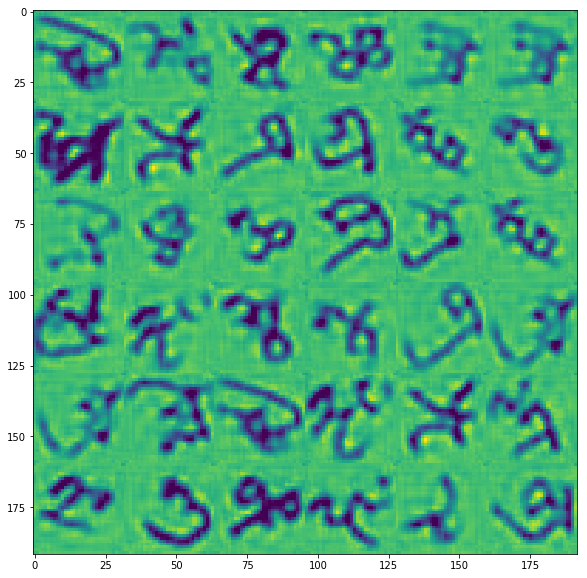

epoch : 59 step : 0 train_loss : 0.043780077
epoch : 59 step : 1 train_loss : 0.046007693
epoch : 59 step : 2 train_loss : 0.0496752
epoch : 59 step : 3 train_loss : 0.047617394
epoch : 59 step : 4 train_loss : 0.041653406
epoch : 59 step : 5 train_loss : 0.0452666
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


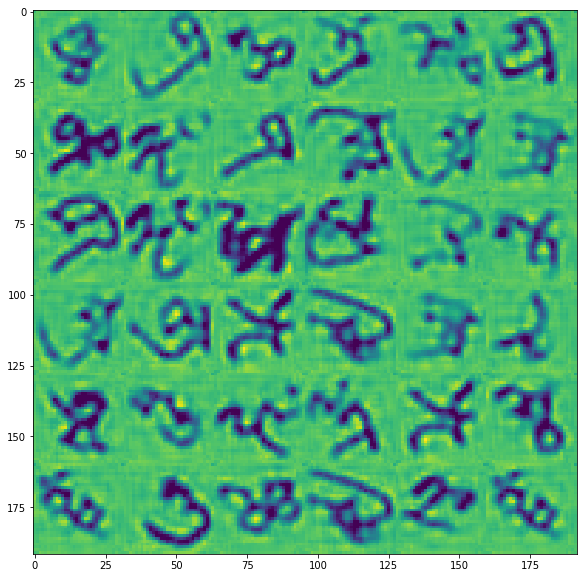

epoch : 60 step : 0 train_loss : 0.04272218
epoch : 60 step : 1 train_loss : 0.04822135
epoch : 60 step : 2 train_loss : 0.043856602
epoch : 60 step : 3 train_loss : 0.046293348
epoch : 60 step : 4 train_loss : 0.044789854
epoch : 60 step : 5 train_loss : 0.043985575
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


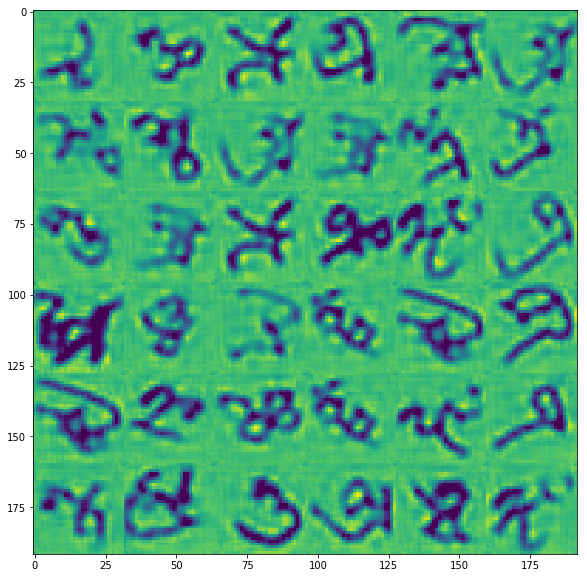

epoch : 61 step : 0 train_loss : 0.040443365
epoch : 61 step : 1 train_loss : 0.04718685
epoch : 61 step : 2 train_loss : 0.043465417
epoch : 61 step : 3 train_loss : 0.04801299
epoch : 61 step : 4 train_loss : 0.042063683
epoch : 61 step : 5 train_loss : 0.04548417
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


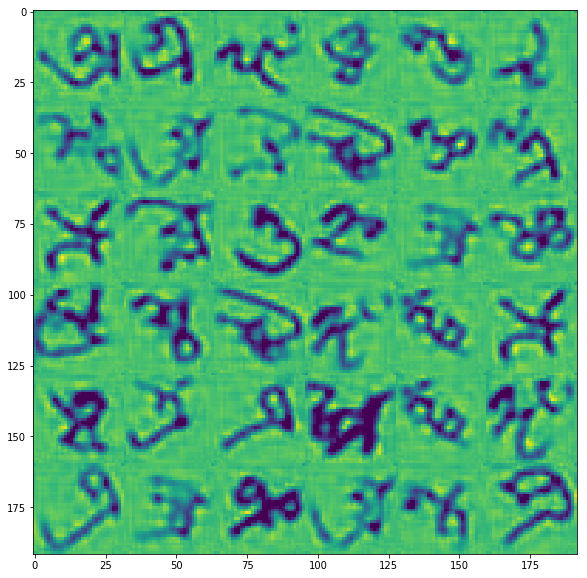

epoch : 62 step : 0 train_loss : 0.043342058
epoch : 62 step : 1 train_loss : 0.045601342
epoch : 62 step : 2 train_loss : 0.04199926
epoch : 62 step : 3 train_loss : 0.039050143
epoch : 62 step : 4 train_loss : 0.048121523
epoch : 62 step : 5 train_loss : 0.041910637
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


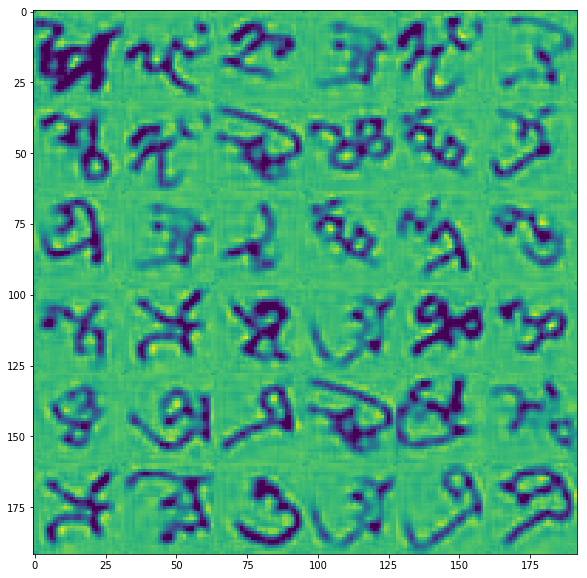

epoch : 63 step : 0 train_loss : 0.038271643
epoch : 63 step : 1 train_loss : 0.039964158
epoch : 63 step : 2 train_loss : 0.046439543
epoch : 63 step : 3 train_loss : 0.043648858
epoch : 63 step : 4 train_loss : 0.041963503
epoch : 63 step : 5 train_loss : 0.044961482
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


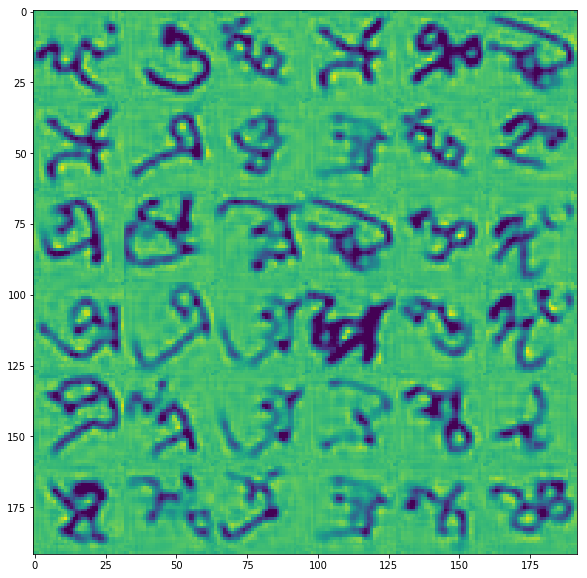

epoch : 64 step : 0 train_loss : 0.045657065
epoch : 64 step : 1 train_loss : 0.03617865
epoch : 64 step : 2 train_loss : 0.04270481
epoch : 64 step : 3 train_loss : 0.04417336
epoch : 64 step : 4 train_loss : 0.042763125
epoch : 64 step : 5 train_loss : 0.041421924
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


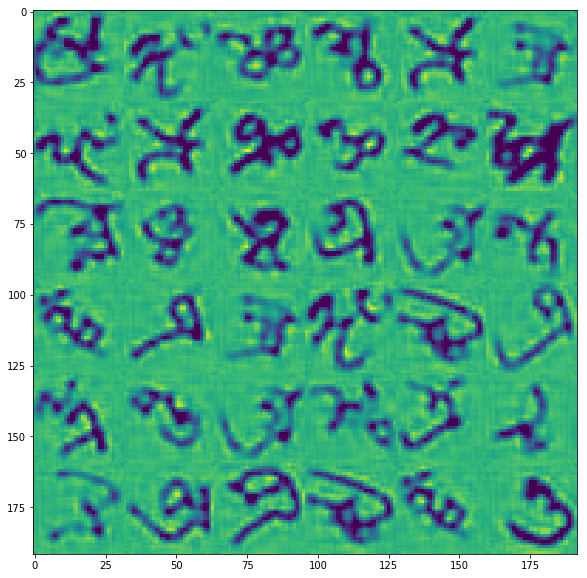

epoch : 65 step : 0 train_loss : 0.045695838
epoch : 65 step : 1 train_loss : 0.040277887
epoch : 65 step : 2 train_loss : 0.040226486
epoch : 65 step : 3 train_loss : 0.040017273
epoch : 65 step : 4 train_loss : 0.04255123
epoch : 65 step : 5 train_loss : 0.037608474
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


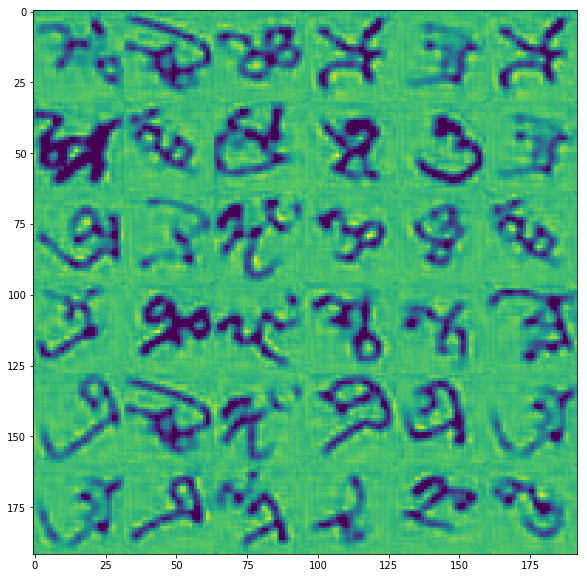

epoch : 66 step : 0 train_loss : 0.044291016
epoch : 66 step : 1 train_loss : 0.03827074
epoch : 66 step : 2 train_loss : 0.040550027
epoch : 66 step : 3 train_loss : 0.041754793
epoch : 66 step : 4 train_loss : 0.040140226
epoch : 66 step : 5 train_loss : 0.038257476
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


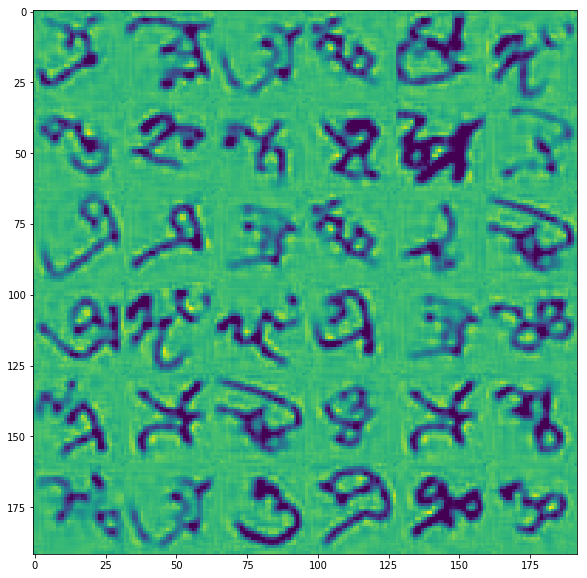

epoch : 67 step : 0 train_loss : 0.037039645
epoch : 67 step : 1 train_loss : 0.03759556
epoch : 67 step : 2 train_loss : 0.0408326
epoch : 67 step : 3 train_loss : 0.03990821
epoch : 67 step : 4 train_loss : 0.03968113
epoch : 67 step : 5 train_loss : 0.04365818
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


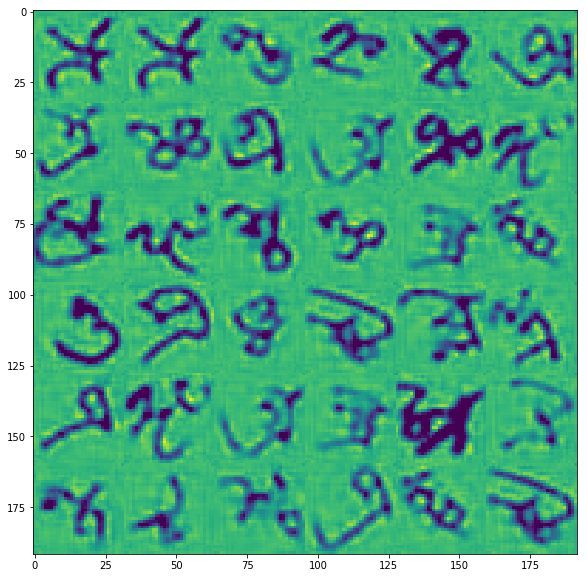

epoch : 68 step : 0 train_loss : 0.038668156
epoch : 68 step : 1 train_loss : 0.03875679
epoch : 68 step : 2 train_loss : 0.034341674
epoch : 68 step : 3 train_loss : 0.038380582
epoch : 68 step : 4 train_loss : 0.042428326
epoch : 68 step : 5 train_loss : 0.040194865
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


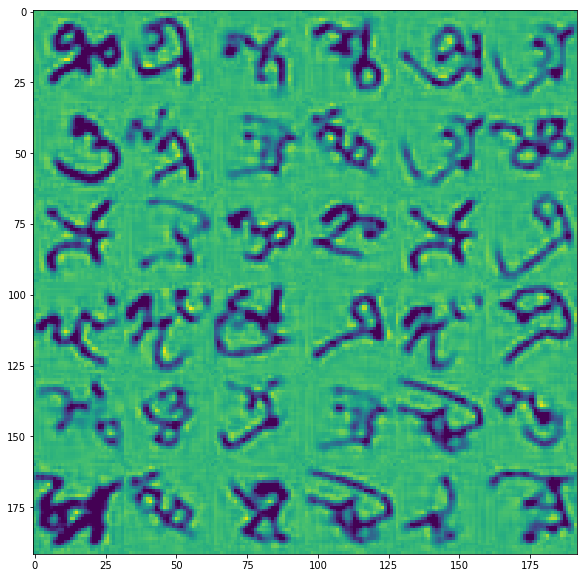

epoch : 69 step : 0 train_loss : 0.037570626
epoch : 69 step : 1 train_loss : 0.037919253
epoch : 69 step : 2 train_loss : 0.03868759
epoch : 69 step : 3 train_loss : 0.034623653
epoch : 69 step : 4 train_loss : 0.03890674
epoch : 69 step : 5 train_loss : 0.04222105
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


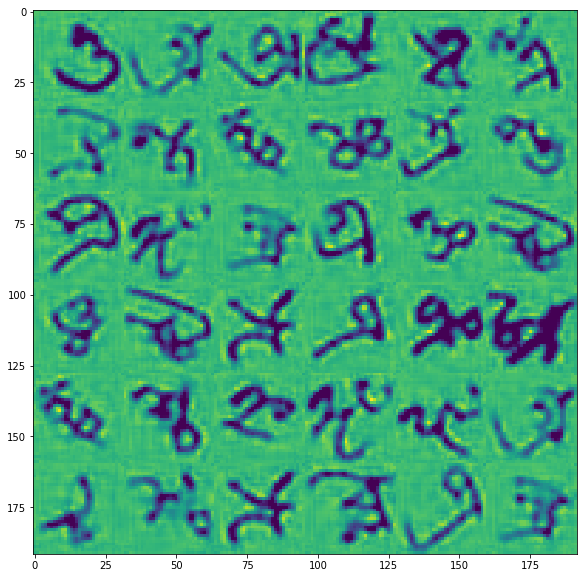

epoch : 70 step : 0 train_loss : 0.035255387
epoch : 70 step : 1 train_loss : 0.03603098
epoch : 70 step : 2 train_loss : 0.040495154
epoch : 70 step : 3 train_loss : 0.039045002
epoch : 70 step : 4 train_loss : 0.039249014
epoch : 70 step : 5 train_loss : 0.03972418
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


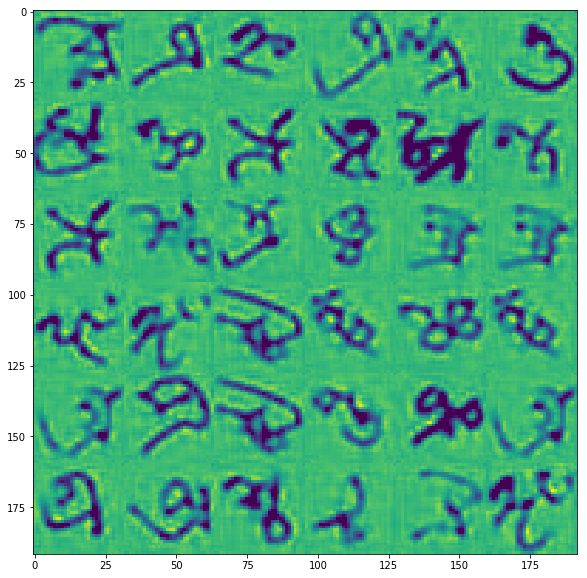

epoch : 71 step : 0 train_loss : 0.035346404
epoch : 71 step : 1 train_loss : 0.040222976
epoch : 71 step : 2 train_loss : 0.03687456
epoch : 71 step : 3 train_loss : 0.03765013
epoch : 71 step : 4 train_loss : 0.038284685
epoch : 71 step : 5 train_loss : 0.036457732
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


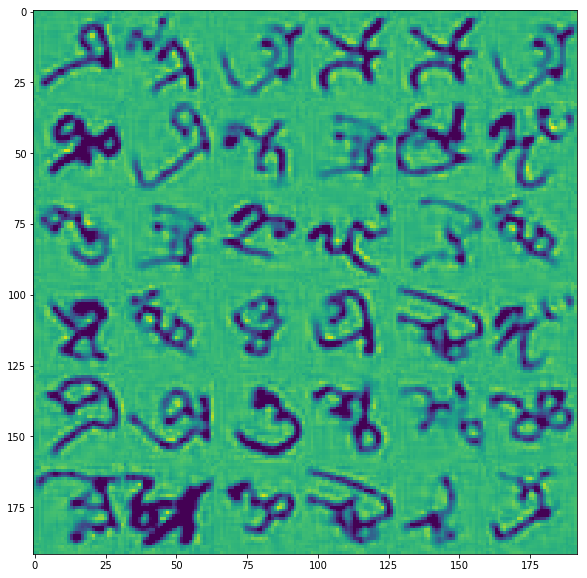

epoch : 72 step : 0 train_loss : 0.033530127
epoch : 72 step : 1 train_loss : 0.035683393
epoch : 72 step : 2 train_loss : 0.034259427
epoch : 72 step : 3 train_loss : 0.04261614
epoch : 72 step : 4 train_loss : 0.040272903
epoch : 72 step : 5 train_loss : 0.034554843
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


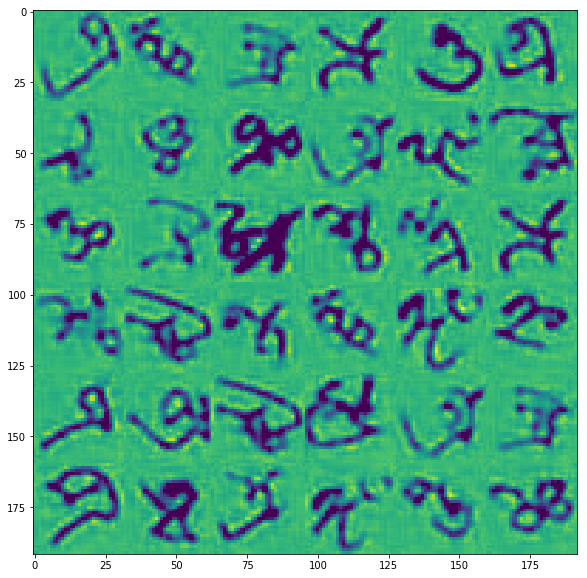

epoch : 73 step : 0 train_loss : 0.037295382
epoch : 73 step : 1 train_loss : 0.040593185
epoch : 73 step : 2 train_loss : 0.030296208
epoch : 73 step : 3 train_loss : 0.037104353
epoch : 73 step : 4 train_loss : 0.040899966
epoch : 73 step : 5 train_loss : 0.043885846
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


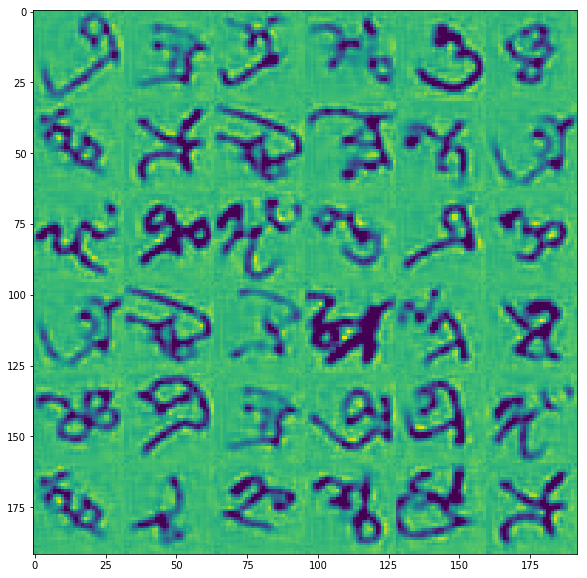

epoch : 74 step : 0 train_loss : 0.03684606
epoch : 74 step : 1 train_loss : 0.037856806
epoch : 74 step : 2 train_loss : 0.042078033
epoch : 74 step : 3 train_loss : 0.035875704
epoch : 74 step : 4 train_loss : 0.043315683
epoch : 74 step : 5 train_loss : 0.048512768
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


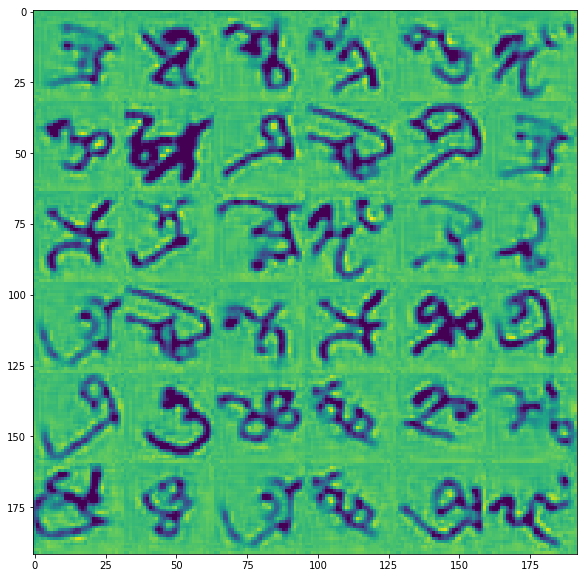

epoch : 75 step : 0 train_loss : 0.036782205
epoch : 75 step : 1 train_loss : 0.043481726
epoch : 75 step : 2 train_loss : 0.046734344
epoch : 75 step : 3 train_loss : 0.041743804
epoch : 75 step : 4 train_loss : 0.0527479
epoch : 75 step : 5 train_loss : 0.044480443
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


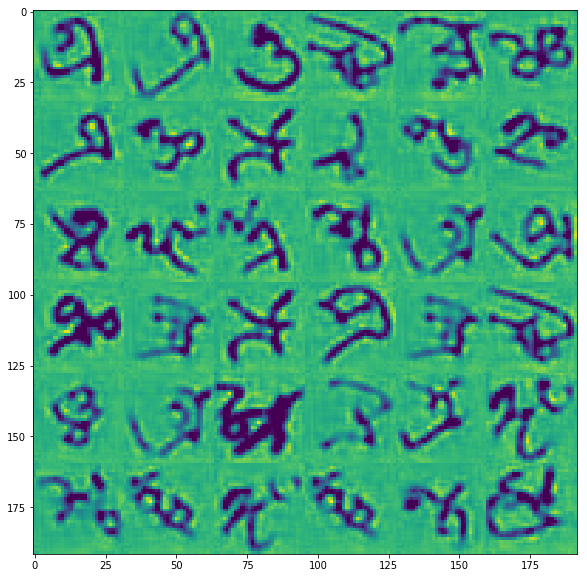

epoch : 76 step : 0 train_loss : 0.041383184
epoch : 76 step : 1 train_loss : 0.04106991
epoch : 76 step : 2 train_loss : 0.040046856
epoch : 76 step : 3 train_loss : 0.04175129
epoch : 76 step : 4 train_loss : 0.04362136
epoch : 76 step : 5 train_loss : 0.036825772
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


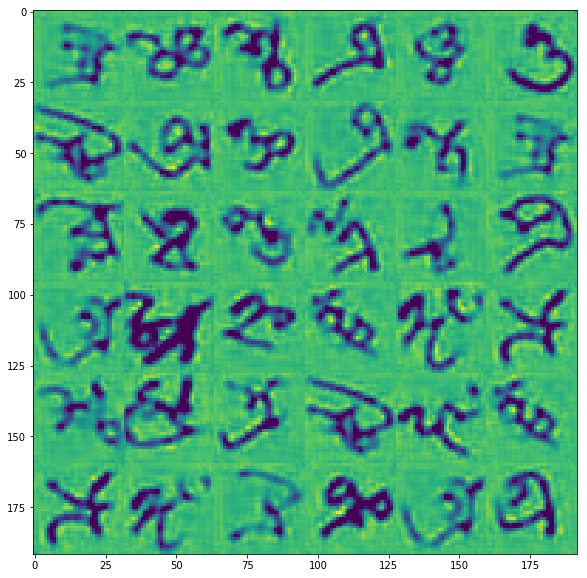

epoch : 77 step : 0 train_loss : 0.035267334
epoch : 77 step : 1 train_loss : 0.03789368
epoch : 77 step : 2 train_loss : 0.03594765
epoch : 77 step : 3 train_loss : 0.04133353
epoch : 77 step : 4 train_loss : 0.039497778
epoch : 77 step : 5 train_loss : 0.038816147
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


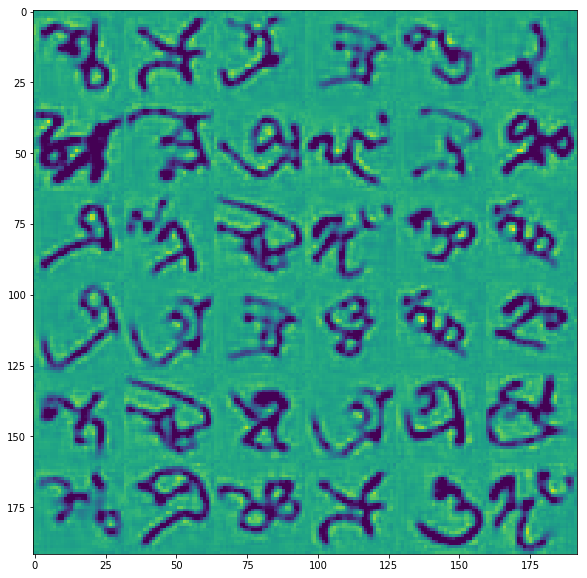

epoch : 78 step : 0 train_loss : 0.03469035
epoch : 78 step : 1 train_loss : 0.03938548
epoch : 78 step : 2 train_loss : 0.040297706
epoch : 78 step : 3 train_loss : 0.0353617
epoch : 78 step : 4 train_loss : 0.03774644
epoch : 78 step : 5 train_loss : 0.036812734
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


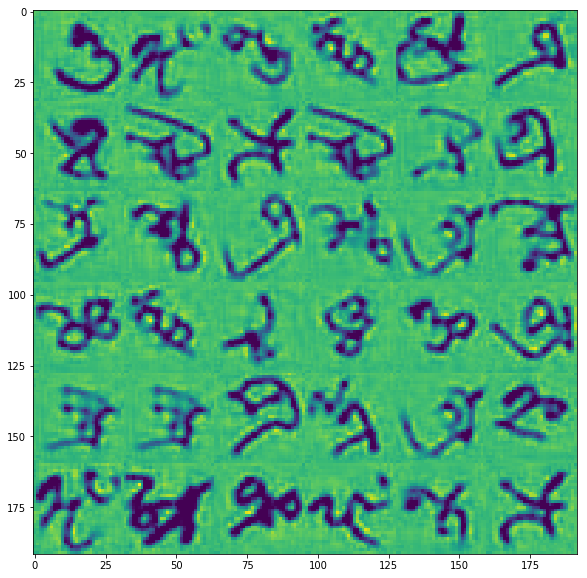

epoch : 79 step : 0 train_loss : 0.036659647
epoch : 79 step : 1 train_loss : 0.035249557
epoch : 79 step : 2 train_loss : 0.039014053
epoch : 79 step : 3 train_loss : 0.039982628
epoch : 79 step : 4 train_loss : 0.036031555
epoch : 79 step : 5 train_loss : 0.029582536
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


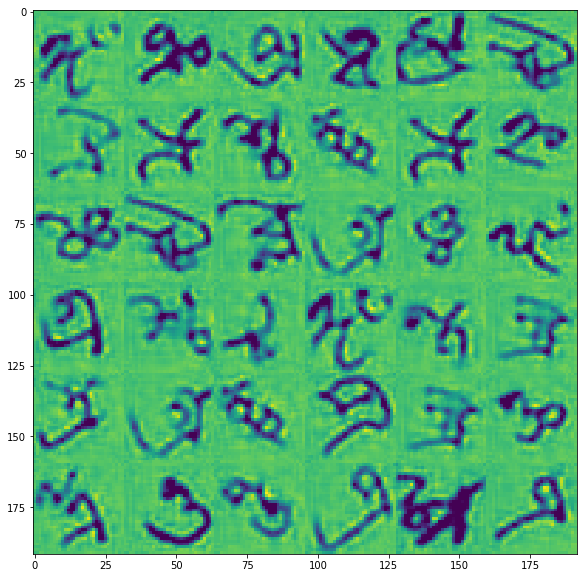

epoch : 80 step : 0 train_loss : 0.03736871
epoch : 80 step : 1 train_loss : 0.03280324
epoch : 80 step : 2 train_loss : 0.037511643
epoch : 80 step : 3 train_loss : 0.036497742
epoch : 80 step : 4 train_loss : 0.033486154
epoch : 80 step : 5 train_loss : 0.03030815
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


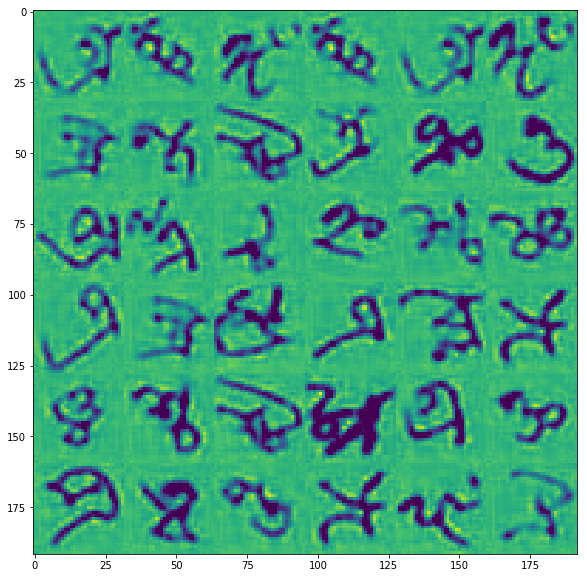

epoch : 81 step : 0 train_loss : 0.032233864
epoch : 81 step : 1 train_loss : 0.036773186
epoch : 81 step : 2 train_loss : 0.035897415
epoch : 81 step : 3 train_loss : 0.028202131
epoch : 81 step : 4 train_loss : 0.03574663
epoch : 81 step : 5 train_loss : 0.03437554
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


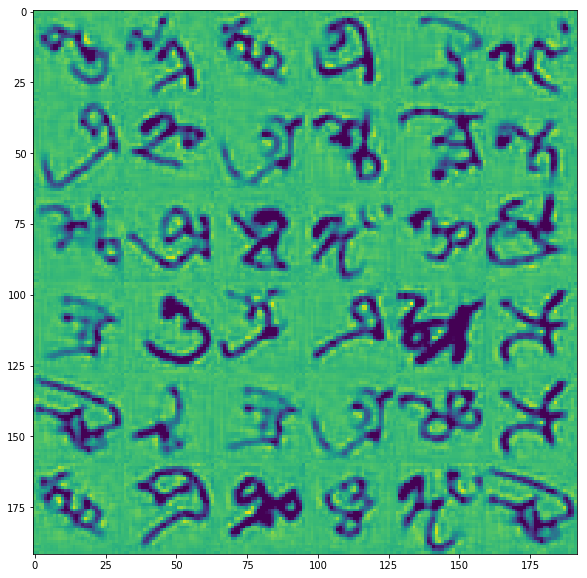

epoch : 82 step : 0 train_loss : 0.029341673
epoch : 82 step : 1 train_loss : 0.031274807
epoch : 82 step : 2 train_loss : 0.031507067
epoch : 82 step : 3 train_loss : 0.03776666
epoch : 82 step : 4 train_loss : 0.035894107
epoch : 82 step : 5 train_loss : 0.03394019
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


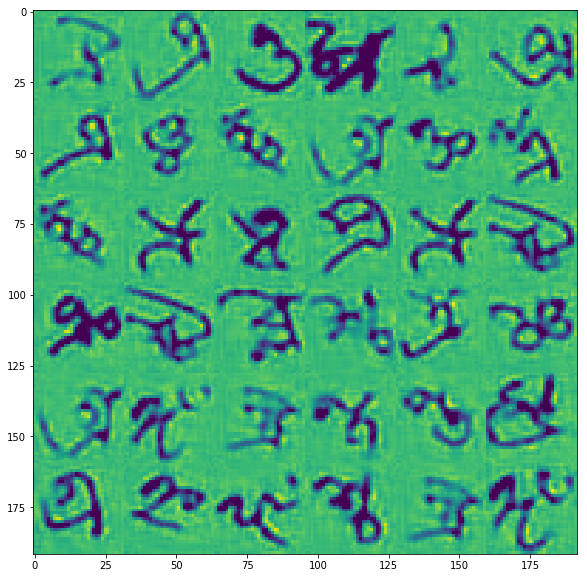

epoch : 83 step : 0 train_loss : 0.029237658
epoch : 83 step : 1 train_loss : 0.030590693
epoch : 83 step : 2 train_loss : 0.03586562
epoch : 83 step : 3 train_loss : 0.031818926
epoch : 83 step : 4 train_loss : 0.032212872
epoch : 83 step : 5 train_loss : 0.035273176
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)
(6, 32, 32, 1)


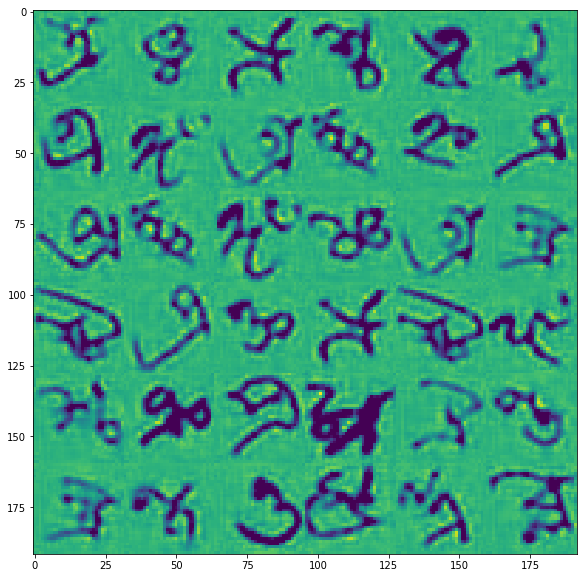

epoch : 84 step : 0 train_loss : 0.031375088
epoch : 84 step : 1 train_loss : 0.034074623
epoch : 84 step : 2 train_loss : 0.032235656
epoch : 84 step : 3 train_loss : 0.02995956


KeyboardInterrupt: 

In [54]:
from tensorflow.python.framework import ops
ops.reset_default_graph()
global sess

config = tf.ConfigProto()
sess = tf.Session(config = config)
graph = tf.get_default_graph()

main(batch)